# Case Study - 2 (RSNA Pneumonia Detection Challenge)


### By Junaid Khan (junaidkhangec@gmail.com) 

# Exploratory Data Analysis

### 1.Data Preparation

In [1]:
#references
#https://www.kaggle.com/peterchang77/exploratory-data-analysis
#https://www.coursera.org/lecture/convolutional-neural-networks/convolutional-implementation-of-sliding-windows-6UnU4
import glob, pylab, pandas as pd
import pydicom, numpy as np
import random
import matplotlib.pyplot as plt
import seaborn as sns
import multiprocessing
import os
import csv
plt.style.use('fivethirtyeight')
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [ ]:
train_data = pd.read_csv('data/stage_2_train_labels.csv')
train_data.shape

(30227, 6)

In [ ]:
train_data.head(10)

,patientId,x,y,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1
5,00436515-870c-4b36-a041-de91049b9ab4,562.0,152.0,256.0,453.0,1
6,00569f44-917d-4c86-a842-81832af98c30,NaN,NaN,NaN,NaN,0
7,006cec2e-6ce2-4549-bffa-eadfcd1e9970,NaN,NaN,NaN,NaN,0
8,00704310-78a8-4b38-8475-49f4573b2dbb,323.0,577.0,160.0,104.0,1
9,00704310-78a8-4b38-8475-49f4573b2dbb,695.0,575.0,162.0,137.0,1


In [ ]:
class_info.head(10)

,patientId,class
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,No Lung Opacity / Not Normal
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,No Lung Opacity / Not Normal
2,00322d4d-1c29-4943-afc9-b6754be640eb,No Lung Opacity / Not Normal
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,Normal
4,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity
5,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity
6,00569f44-917d-4c86-a842-81832af98c30,No Lung Opacity / Not Normal
7,006cec2e-6ce2-4549-bffa-eadfcd1e9970,No Lung Opacity / Not Normal
8,00704310-78a8-4b38-8475-49f4573b2dbb,Lung Opacity
9,00704310-78a8-4b38-8475-49f4573b2dbb,Lung Opacity


In [ ]:
len(train_data.patientId.unique())

26684

In [ ]:
# calculating aspect_ratio & area
train_data['aspect_ratio'] = (train_data['width']/train_data['height'])
train_data['area'] = train_data['width'] * train_data['height']

In [ ]:
# function to get info from dicom file
def get_dicom_info(patientId, root_dir='data/stage_2_train_images/'):
    fn = os.path.join(root_dir, f'{patientId}.dcm')
    dcm_data = pydicom.read_file(fn)
    return {'age': dcm_data.PatientAge, 
            'gender': dcm_data.PatientSex, 
            'id': os.path.basename(fn).split('.')[0]}

In [ ]:
# getting info from dicom file
patient_ids = list(train_data.patientId.unique())
dicom_info=[]
for i in patient_ids:
    dicom_info.append(get_dicom_info(i))

dicom_info = pd.DataFrame(dicom_info)
dicom_info['gender'] = dicom_info['gender'].astype('category')
dicom_info['age'] = dicom_info['age'].astype(int)

In [ ]:
# merging label info with dicom info
train_data = (train_data.merge(dicom_info, left_on='patientId', right_on='id', how='left')
        .drop(columns='id'))

In [ ]:
train_data.head()

,patientId,x,y,width,height,Target,aspect_ratio,area,age,gender
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0,NaN,NaN,51,F
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0,NaN,NaN,48,F
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0,NaN,NaN,19,M
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0,NaN,NaN,28,M
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1,0.562005,80727.0,32,F


In [ ]:
# saving whole data
train_data.to_csv('data/train_data.csv',index=False)

In [ ]:
# reading data
train_data= pd.read_csv('data/train_data.csv')

In [ ]:
# reading class info
class_info = pd.read_csv('data/stage_2_detailed_class_info.csv')

In [ ]:
# utility functions 

def draw(data):
    """
    Method to draw single patient with bounding box(es) if present 

    """
    # --- Open DICOM file
    d = pydicom.read_file(data['dicom'])
    im = d.pixel_array

    # --- Convert from single-channel grayscale to 3-channel RGB
    im = np.stack([im] * 3, axis=2)

    # --- Add boxes with random color if present
    for box in data['boxes']:
        rgb = np.floor(np.random.rand(3) * 256).astype('int')
        im = overlay_box(im=im, box=box, rgb=rgb, stroke=6)

    pylab.imshow(im, cmap=pylab.cm.gist_gray)
    pylab.axis('off')

def overlay_box(im, box, rgb, stroke=1):
    """
    Method to overlay single box on image

    """
    # --- Convert coordinates to integers
    box = [int(b) for b in box]
    
    # --- Extract coordinates
    y1, x1, height, width = box
    y2 = y1 + height
    x2 = x1 + width

    im[y1:y1 + stroke, x1:x2] = rgb
    im[y2:y2 + stroke, x1:x2] = rgb
    im[y1:y2, x1:x1 + stroke] = rgb
    im[y1:y2, x2:x2 + stroke] = rgb

    return im

def parse_data(df):
    """
    Method to read a CSV file (Pandas dataframe) and parse the 
    data into the following nested dictionary:

      parsed = {
        
        'patientId-00': {
            'dicom': path/to/dicom/file,
            'label': either 0 or 1 for normal or pnuemonia, 
            'boxes': list of box(es)
        },
        'patientId-01': {
            'dicom': path/to/dicom/file,
            'label': either 0 or 1 for normal or pnuemonia, 
            'boxes': list of box(es)
        }, ...

      }

    """
    # --- Define lambda to extract coords in list [y, x, height, width]
    extract_box = lambda row: [row['y'], row['x'], row['height'], row['width']]

    parsed = {}
    for n, row in df.iterrows():
        # --- Initialize patient entry into parsed 
        pid = row['patientId']
        if pid not in parsed:
            parsed[pid] = {
                'dicom': 'data/stage_2_train_images/%s.dcm' % pid,
                'label': row['Target'],
                'boxes': []}

        # --- Add box if opacity is present
        if parsed[pid]['label'] == 1:
            parsed[pid]['boxes'].append(extract_box(row))

    return parsed
parsed = parse_data(train_data)
print(parsed['00436515-870c-4b36-a041-de91049b9ab4'])

{'dicom': 'data/stage_2_train_images/00436515-870c-4b36-a041-de91049b9ab4.dcm', 'label': 1, 'boxes': [[152.0, 264.0, 379.0, 213.0], [152.0, 562.0, 453.0, 256.0]]}


In [ ]:
len(parsed)

26684

In [ ]:
train_data['Target'].value_counts()

0    20672
1     9555
Name: Target, dtype: int64

In [ ]:
class_info['class'].value_counts()

No Lung Opacity / Not Normal    11821
Lung Opacity                     9555
Normal                           8851
Name: class, dtype: int64

### 2.Data Overview

#### 2.1 Sample DICOM file

In [ ]:
patientId = train_data['patientId'][0]
dcm_file = 'data/stage_2_train_images/%s.dcm' % patientId
dcm_data = pydicom.read_file(dcm_file)

print(dcm_data)

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 202
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: Secondary Capture Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.2.276.0.7230010.3.1.4.8323329.28530.1517874485.775526
(0002, 0010) Transfer Syntax UID                 UI: JPEG Baseline (Process 1)
(0002, 0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.0
(0002, 0013) Implementation Version Name         SH: 'OFFIS_DCMTK_360'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0016) SOP Class UID                       UI: Secondary Capture Image Storage
(0008, 0018) SOP Instance UID                    UI: 1.2.276.0.7230010.3.1.4.8323329.28530.1517874485.775526
(0008, 0020) Study Date                          DA: '19010101'
(0008, 0030) Study Time      

#### 2.2 Sample CXR image (without opacities)

(-0.5, 1023.5, 1023.5, -0.5)

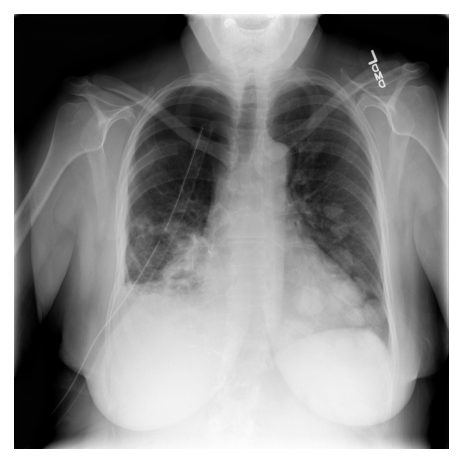

In [ ]:
# reading image array from DICOM file
im = dcm_data.pixel_array
pylab.imshow(im, cmap=pylab.cm.gist_gray)
pylab.axis('off')

#### 2.3 CXR image with bounding box around opacities

In [12]:
def get_id(data,bbox=1):
    keys = data.keys()
    for i in keys:
        if len(data[i]['boxes']) == bbox:
            return i

* **Image with 1 bounding box**

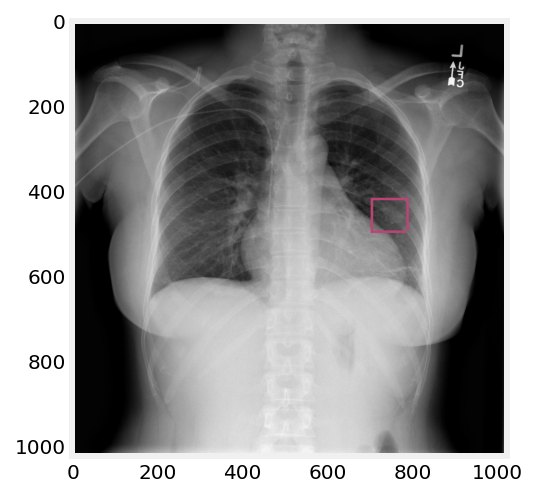

In [28]:
im = draw(parsed[get_id(parsed,bbox=1)])
plt.grid(False)
plt.imshow(im, cmap=pylab.cm.gist_gray)

* **Image with 2 bounding boxes**

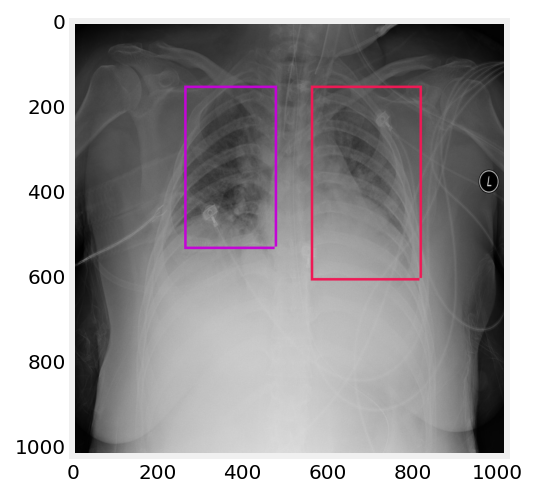

In [29]:
im = draw(parsed[get_id(parsed,bbox=2)])
plt.grid(False)
plt.imshow(im, cmap=pylab.cm.gist_gray)

* **Image with 3 bounding boxes**

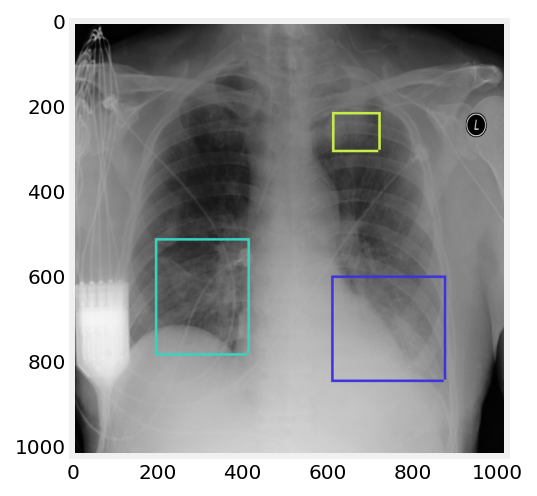

In [31]:
im = draw(parsed[get_id(parsed,bbox=3)])
plt.grid(False)
plt.imshow(im, cmap=pylab.cm.gist_gray)

* **Image with 4 bounding boxes**

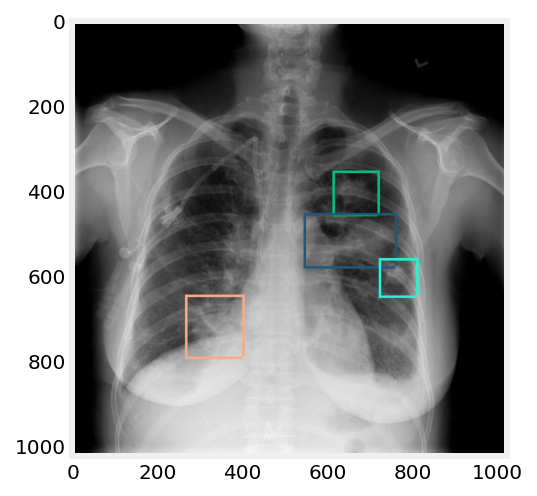

In [33]:
im = draw(parsed[get_id(parsed,bbox=4)])
plt.grid(False)
plt.imshow(im, cmap=pylab.cm.gist_gray)

**Observation:-**
1. The minimum number of opacities is 1.
2. the maximum number of opacities is 4.

### 3.Univariate Analysis

#### 3.1 Class Imbalance

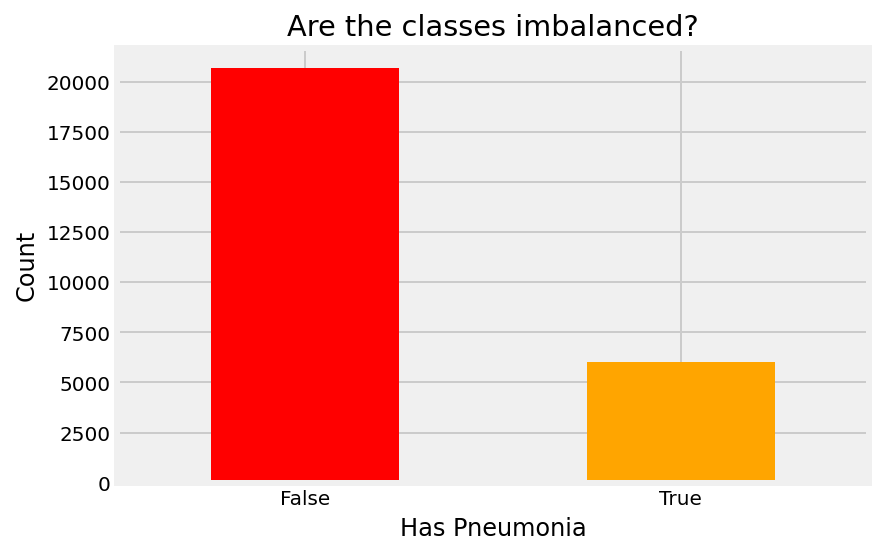

In [ ]:
boxes_per_patient = train_data.groupby('patientId')['Target'].sum()
ax = (boxes_per_patient > 0).value_counts().plot.bar(color= ['red','orange'])
ax.set_title('Are the classes imbalanced?')
ax.set_xlabel('Has Pneumonia')
ax.set_ylabel('Count')
ax.xaxis.set_tick_params(rotation=0)
plt.show()

**Observation:-**
1. From the plot,it is clear that the data is highly imbalanced.
2. There is almost 5000 positive & 20000 negative points.
3. The imbalance ratio is almost 4:1 (negative:positive)
4. The reason behind the imbalance is that there are almost 11000 datapoints which are classified as No Lung Opacity / Not Normal, but those points are also considered as negative.

#### 3.2 Bounding Box X-Coordinates 

In [ ]:
# function to plot PDF
def plot_pdf(data,x_label,y_label,title):
    f,ax = plt.subplots(1,1, figsize=(7.5,4))
    sns.distplot(a=data, ax=ax)
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title(title)
    plt.show()

# function to plot CDF
def plot_cdf(data,x_label,y_label,title):
    f,ax = plt.subplots(1,1, figsize=(7.5,4))
    counts, bin_edges = np.histogram(data.dropna(), bins=10, 
                                     density = True)
    pdf = counts/(sum(counts))#cal pdf
    cdf = np.cumsum(pdf)#cumulative sum of pdf,calculating cdf
    plt.plot(bin_edges[1:], cdf)
    plt.ylabel(y_label)
    plt.xlabel(x_label)
    plt.title(title)
    plt.show()
# function to plot box_plot    
def box_plot(data,col,title):
    f,ax = plt.subplots(1,1, figsize=(7.5,4))
    sns.boxplot(y=col, data=data,ax=ax)
    plt.title(title)
    plt.show()

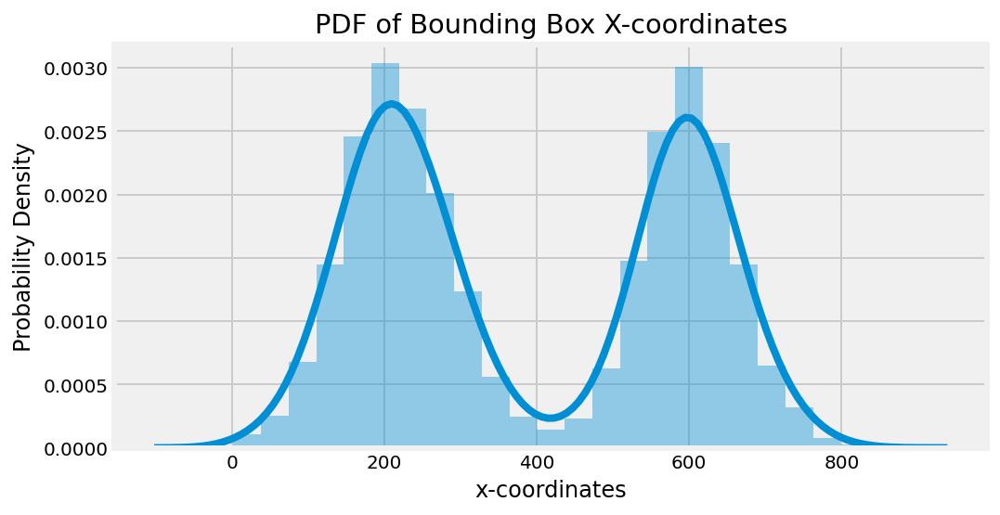

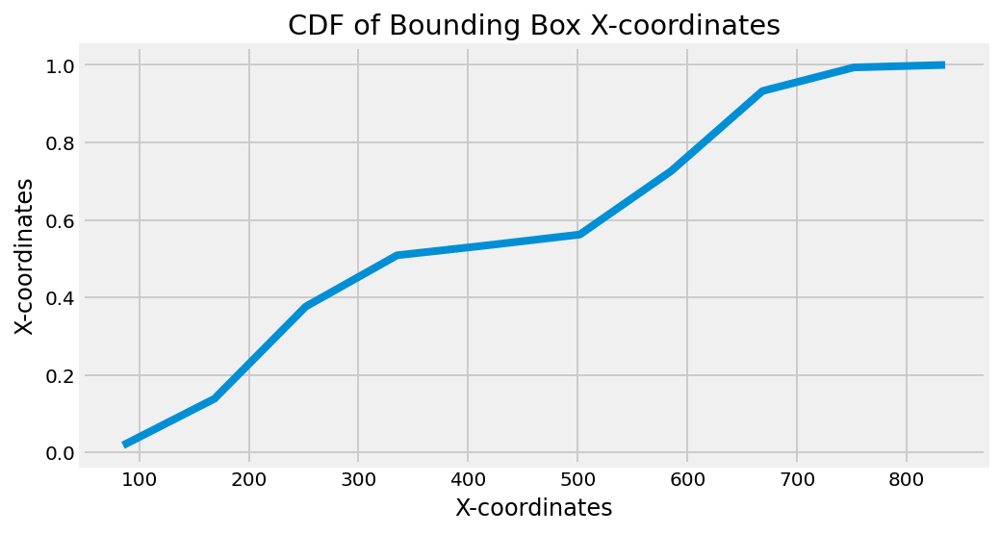

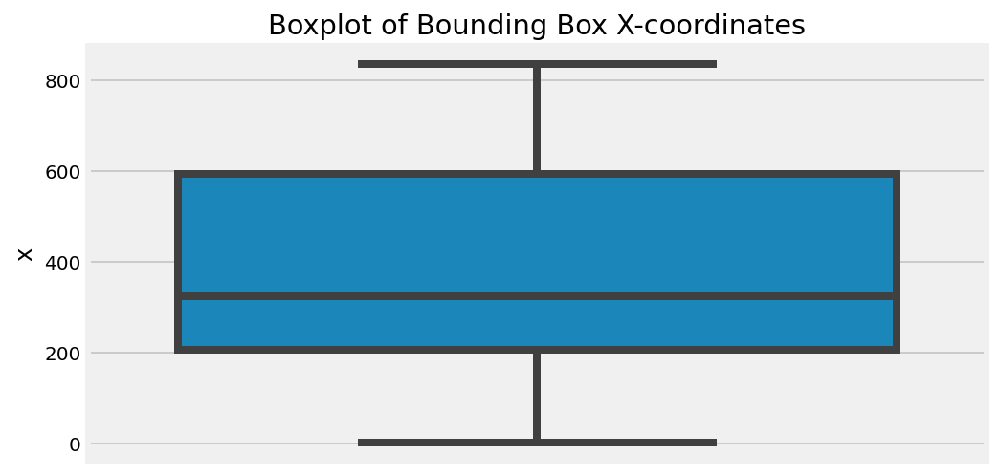

In [ ]:
plot_pdf(train_data.x.values,'x-coordinates','Probability Density','PDF of Bounding Box X-coordinates')
plot_cdf(train_data['x'],'X-coordinates','X-coordinates','CDF of Bounding Box X-coordinates')
box_plot(train_data,'x','Boxplot of Bounding Box X-coordinates')

>**Observation:-**
1. The double-bell curve that we got in PDF of x-coordinates is due to the location of the lungs (as the opacity bounding boxes are on lungs only).
2. The x-coordinates passing over the lungs has high values in comparison to the area which do not have lungs.
3. The range that we got for x-coordinates is from 0 to 800.
4. Almost 99% of the x-coordinate values are less that 750.
5. The IQR(interquartile range) that we got is from 200 (25th percentile) & 600(75th percentile).
6. The median value that we got is 300(approx)

#### 3.3 Bounding Box y-Coordinates 

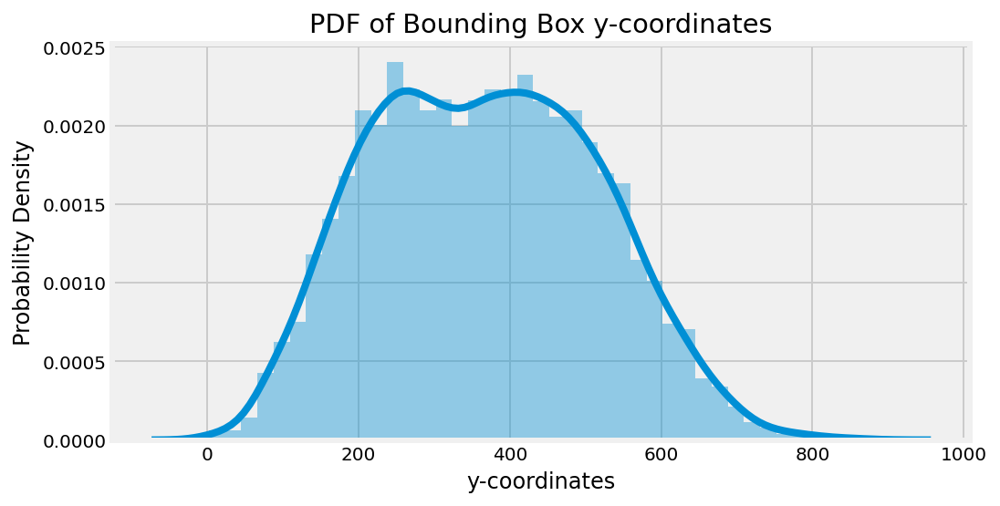

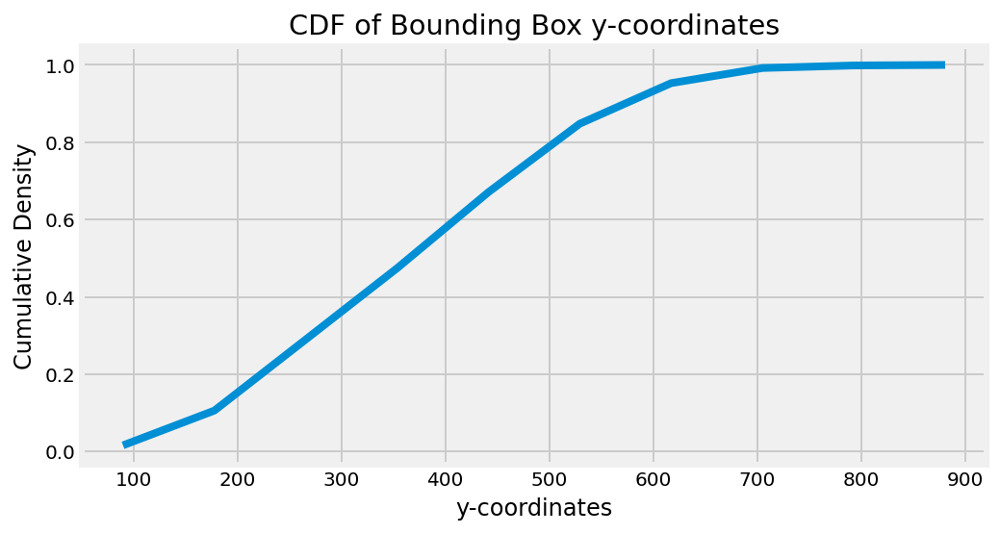

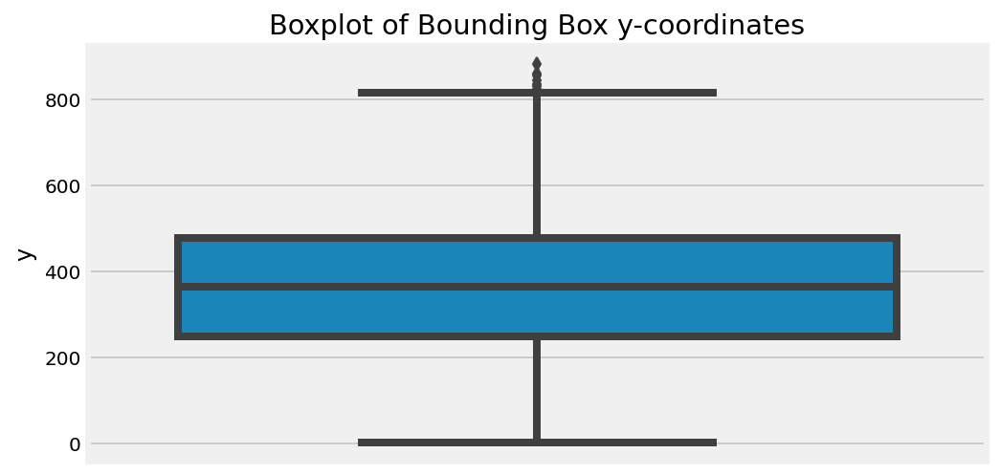

In [ ]:
plot_pdf(train_data.y.values,'y-coordinates','Probability Density','PDF of Bounding Box y-coordinates')
plot_cdf(train_data['y'],'y-coordinates','Cumulative Density','CDF of Bounding Box y-coordinates')
box_plot(train_data,'y','Boxplot of Bounding Box y-coordinates')

>**Observation:-**
1. The decline that we can observe at the middle of the curve is due to the centre of the chest as there is no lungs at the centre (and bounding boxes are only on lungs).
2. The minimum & maximum value that we got is 0 and 800 respectively.
3. Almost 99% values are between 100 & 700.
4. The IQR(inerquartile range) we got is from 250 (25th percentile) & 500 (75th percentile).
5. The median value that we got is 350 (approx).
6. There are certain outlier values also above 800.

#### 3.4 Bounding Box width

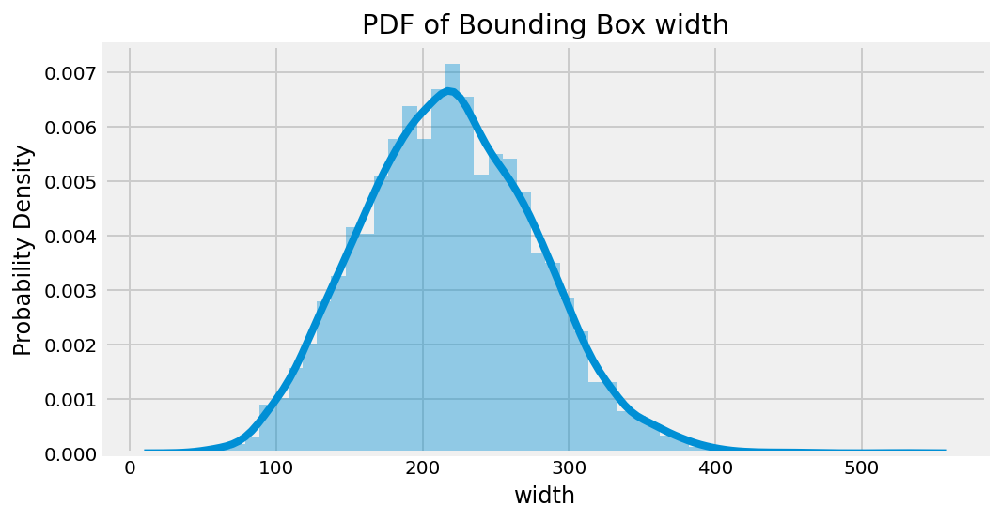

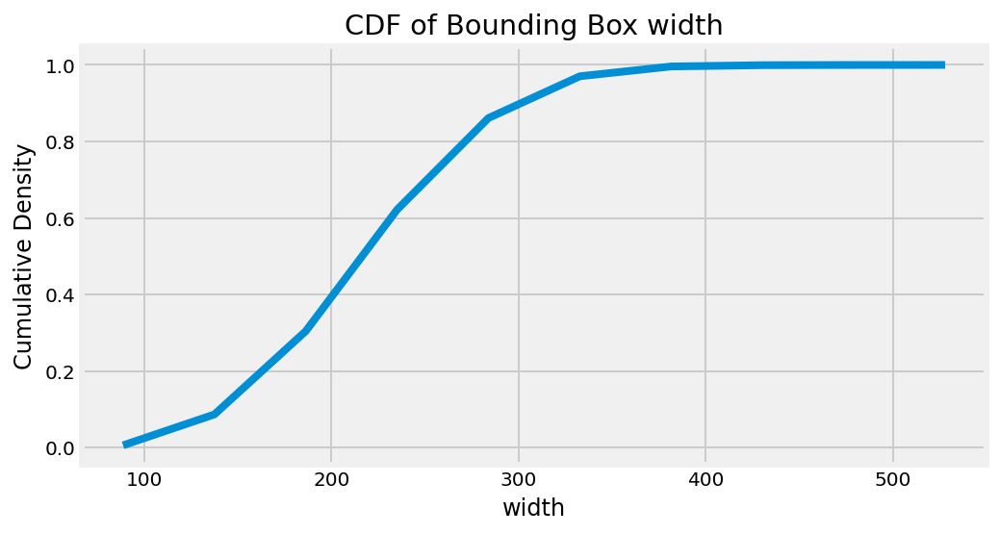

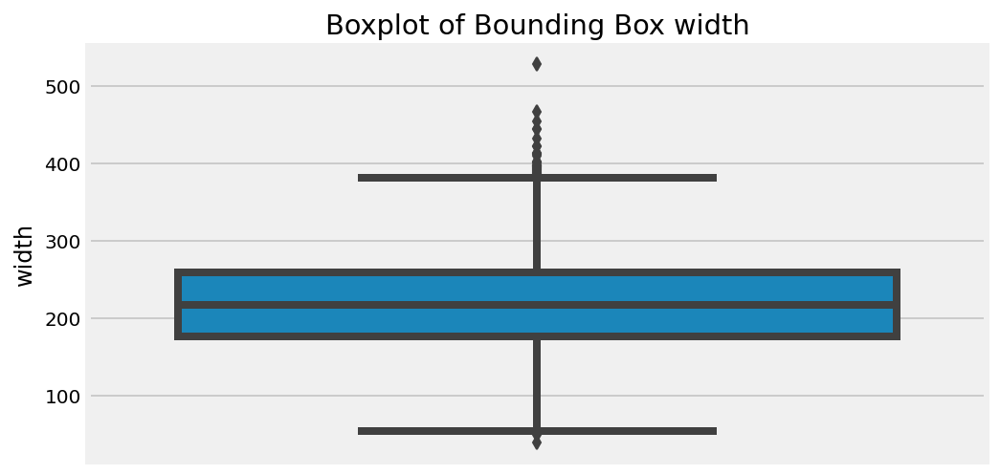

In [ ]:
plot_pdf(train_data.width.values,'width','Probability Density','PDF of Bounding Box width')
plot_cdf(train_data['width'],'width','Cumulative Density','CDF of Bounding Box width')
box_plot(train_data,'width','Boxplot of Bounding Box width')

>**Observation:-**
1. The PDF of the bounding box width that we got is approx normally distributed.
2. The minimum & maximum values that we got is 50 & 400 with certain outliers above 400.
3. Almost 99% values are less than 350.
4. The IQR(interquartile range) that we got is from 175 to 275 respectively.
5. The median value that we got is 225 (approx).

#### 3.5 Bounding Box Height

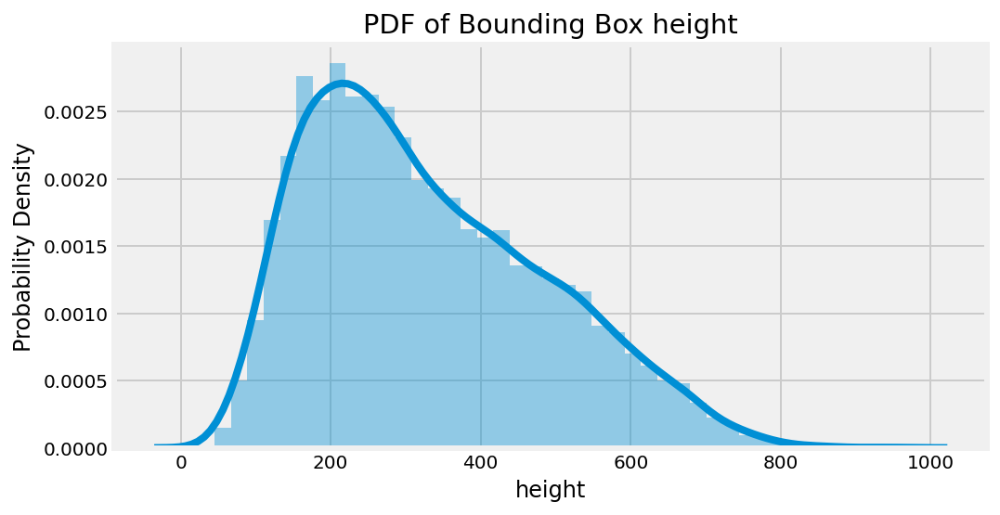

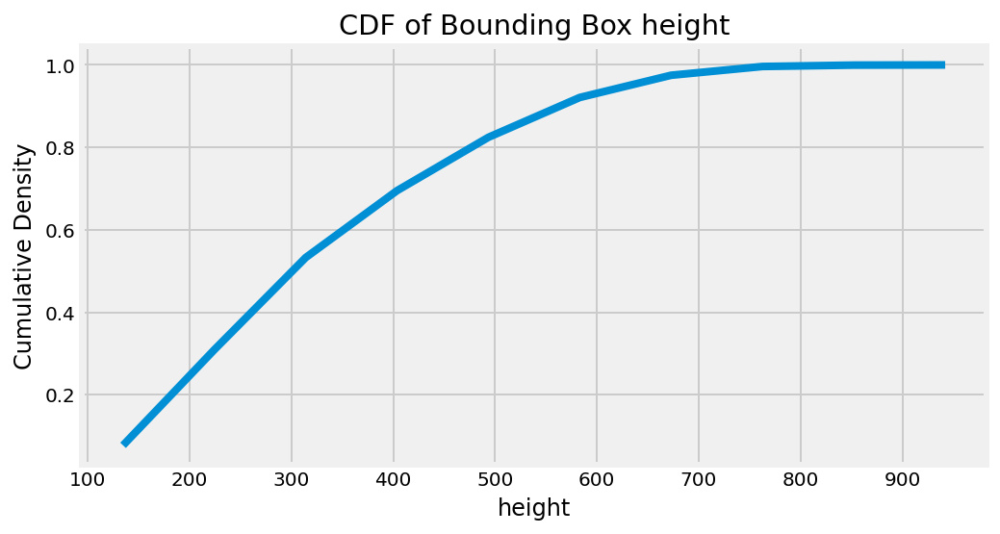

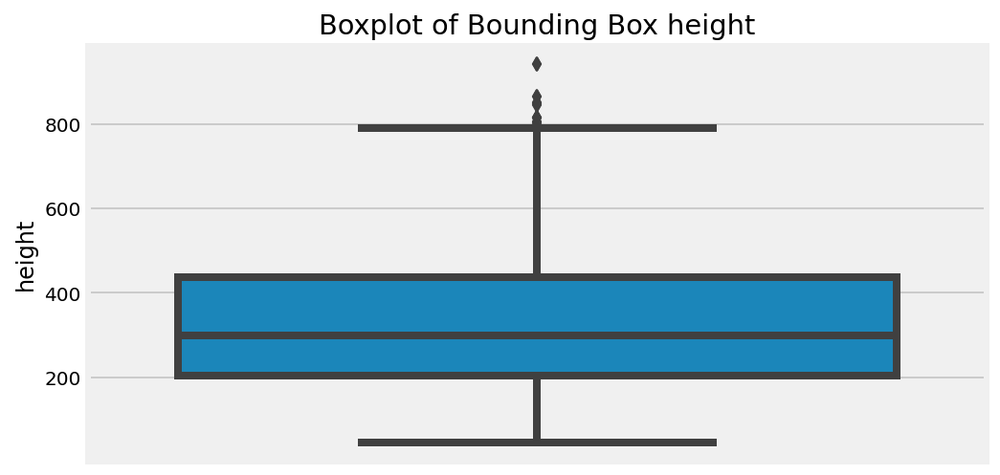

In [ ]:
plot_pdf(train_data.height.values,'height','Probability Density','PDF of Bounding Box height')
plot_cdf(train_data['height'],'height','Cumulative Density','CDF of Bounding Box height')
box_plot(train_data,'height','Boxplot of Bounding Box height')

>**Observation:-**
1. The PDF of the bounding box height that we got is positively skewed.
2. The minimum & maximum values that we got is 0 & 800 with certain outliers above 800.
3. Almost 99% values are less than 700.
4. The IQR(interquartile range) that we got is from 200 to 450 respectively.
5. The median value that we got is 300 (approx).

#### 3.6 Bounding Box Area

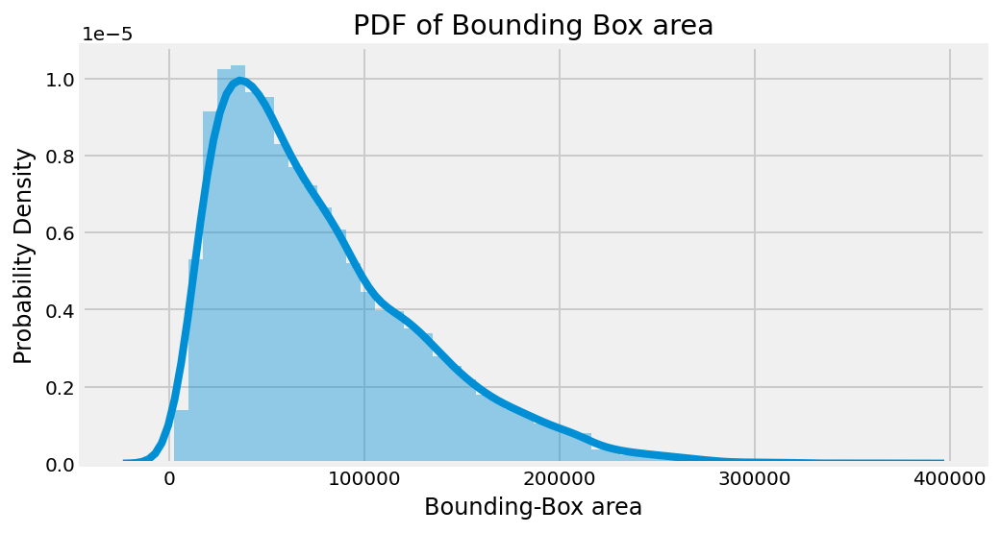

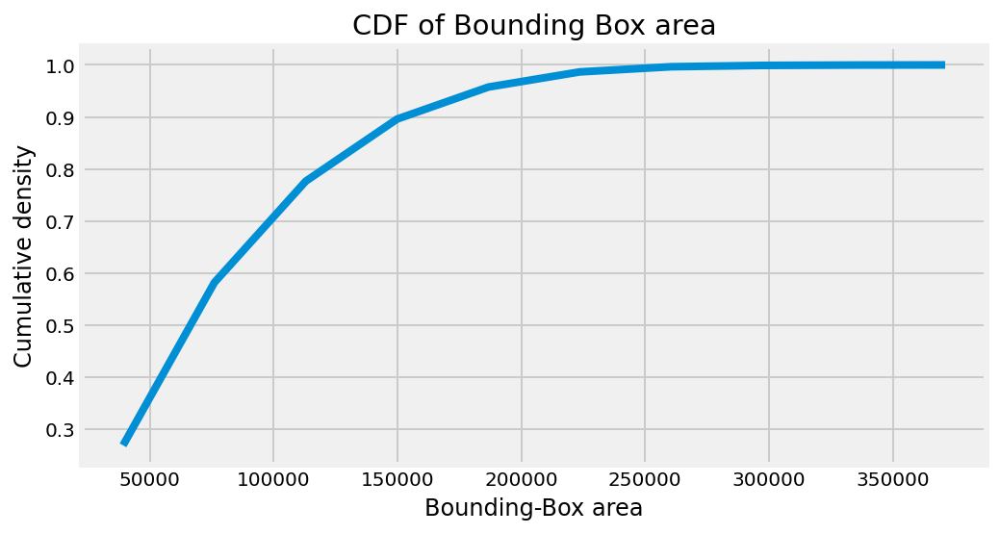

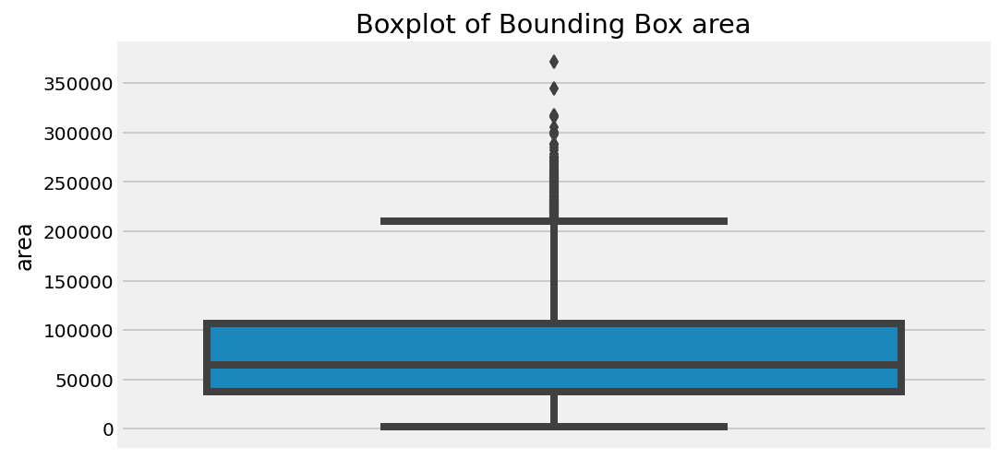

In [ ]:
plot_pdf(train_data.area.values,'Bounding-Box area','Probability Density','PDF of Bounding Box area')
plot_cdf(train_data['area'],'Bounding-Box area','Cumulative density','CDF of Bounding Box area')
box_plot(train_data,'area','Boxplot of Bounding Box area')

>**Observation:-**
1. The PDF of the bounding box bounding-box area that we got is positively skewed.
2. The general minimum & maximum values that we got is 0 & 200000px (pixels) respectively.
3. Almost 99% values are less than 250000.
4. The IQR(interquartile range) that we got is from 25000 to 100000 respectively.
5. There are certain outliers above 200000.

#### 3.7 Bounding Box Aspect Ratio

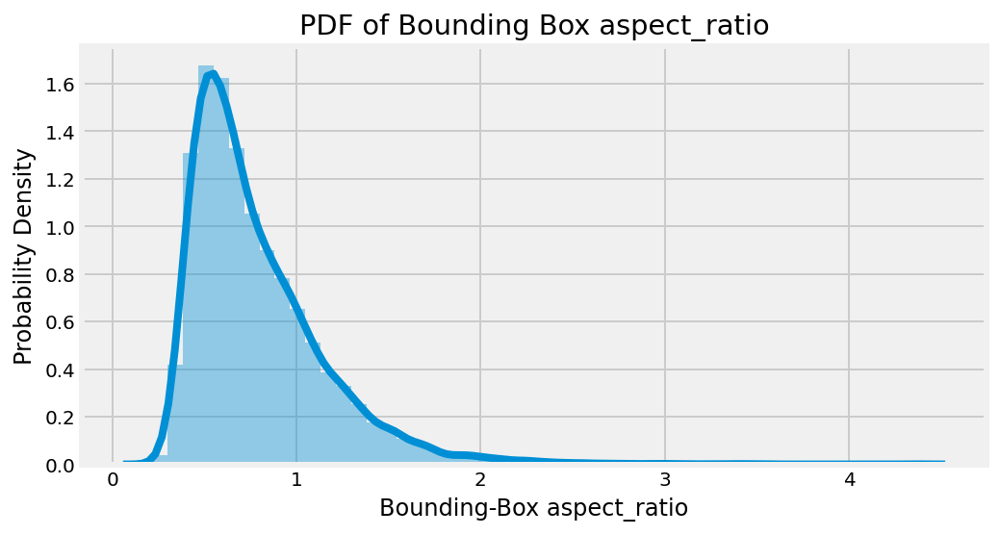

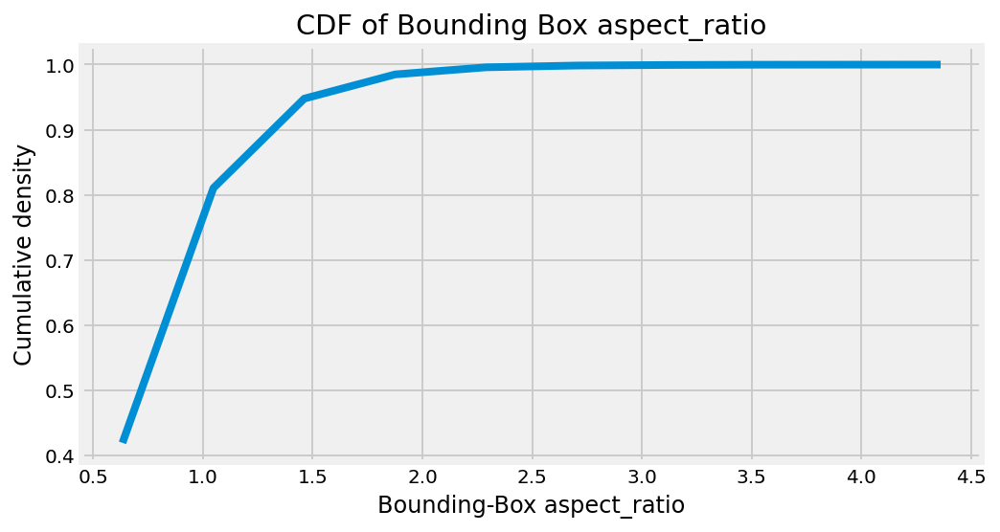

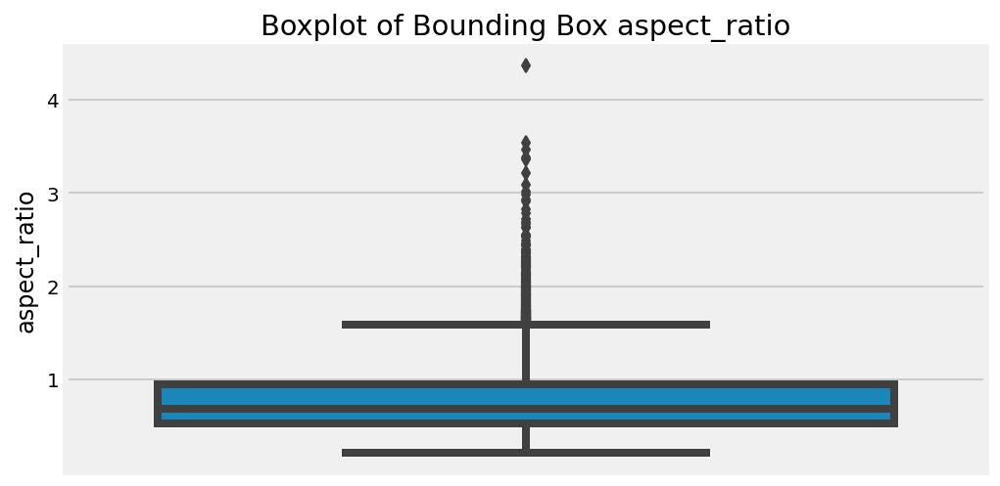

In [ ]:
plot_pdf(train_data.aspect_ratio.values,'Bounding-Box aspect_ratio','Probability Density','PDF of Bounding Box aspect_ratio')
plot_cdf(train_data['aspect_ratio'],'Bounding-Box aspect_ratio','Cumulative density','CDF of Bounding Box aspect_ratio')
box_plot(train_data,'aspect_ratio','Boxplot of Bounding Box aspect_ratio')

>**Observation:-**
1. The PDF of the bounding box bounding-box area that we got is positively skewed.
2. The general minimum & maximum values that we got is 0 & 2 respectively.
3. Almost 99% values are less than 2.
4. The IQR(interquartile range) that we got is from 0.5 to 1 respectively.
5. There are certain outliers above 1.75.

#### 3.8 Patient's Age

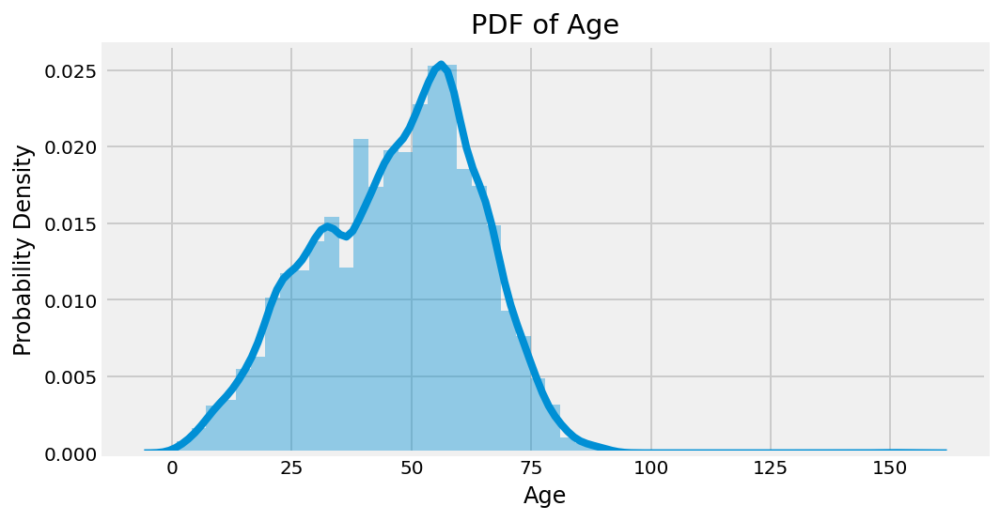

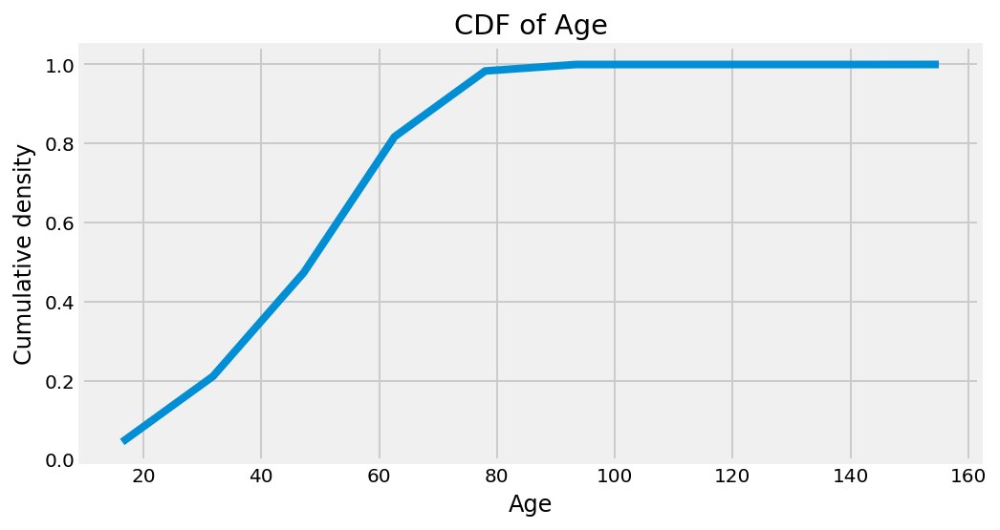

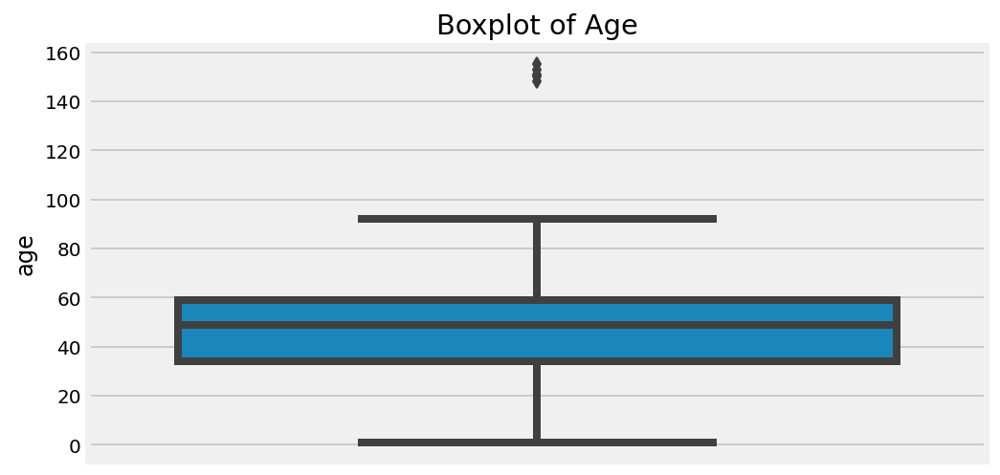

In [ ]:
plot_pdf(train_data.age.values,'Age','Probability Density','PDF of Age')
plot_cdf(train_data['age'],'Age','Cumulative density','CDF of Age')
box_plot(train_data,'age','Boxplot of Age')

>**Observation:-**
1. The range of patient's age is from 15 to 95 years.
2. There are certain values beween 140 and 160 years which are certainly outliers.
3. The age group from 30 to 95 is highly prone to the disease.
4. The IQR range is from 30 to 60 years respectively.
5. The median age of the patients is 50 years.

#### 3.9 Age distribution by gendre and target

Text(0.5, 1.02, 'Age distribution by gender and target')

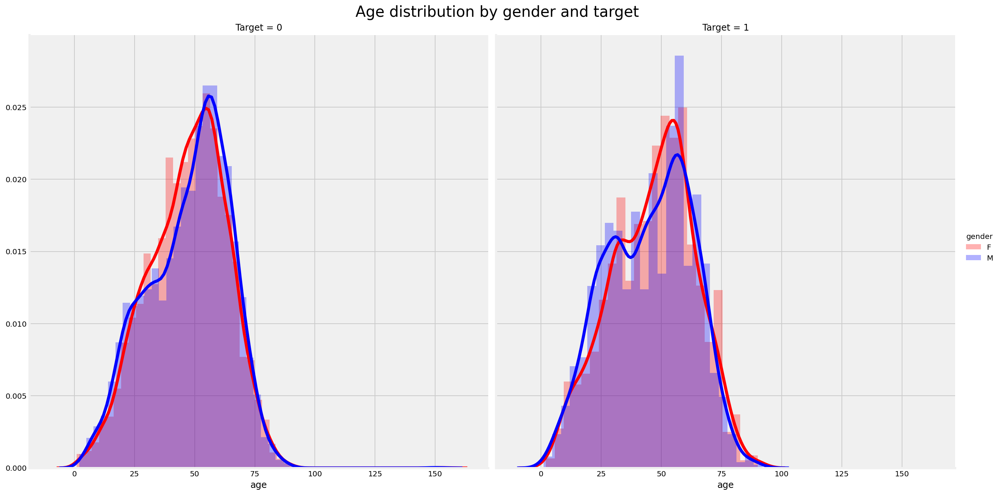

In [ ]:
g = sns.FacetGrid(col='Target', hue='gender', 
                  data=train_data.drop_duplicates(subset=['patientId']), 
                  height=9, palette=dict(F="red", M="blue"))
g.map(sns.distplot, 'age', hist_kws={'alpha': 0.3}).add_legend()
g.fig.suptitle("Age distribution by gender and target", y=1.02, fontsize=20)

>**Observation**:-
1. There is perfect overlap between the distribution of both the genders for both Target=0 & Target=1.
2. Both the relations looks almost same, it explains fact that both Target = 0 & Target = 1 follows same trend in terms of age. 
2. It explains the fact that there isn't any specif relation between the disease & the gendre.
3. Even when we compare this target & gendre based plot with the above explained overall age based plot we can easily observe that both are following same trend regardless of gendre & target.

## 4.Bivariate Analysis 

#### 4.1 Bounding Box Centroid plot (to detect outliers bounding boxes)

In [ ]:
# getting centres of bounding boxes
centers = (train_data.dropna(subset=['x'])
           .assign(center_x=train_data.x + train_data.width / 2, center_y=train_data.y + train_data.height / 2))

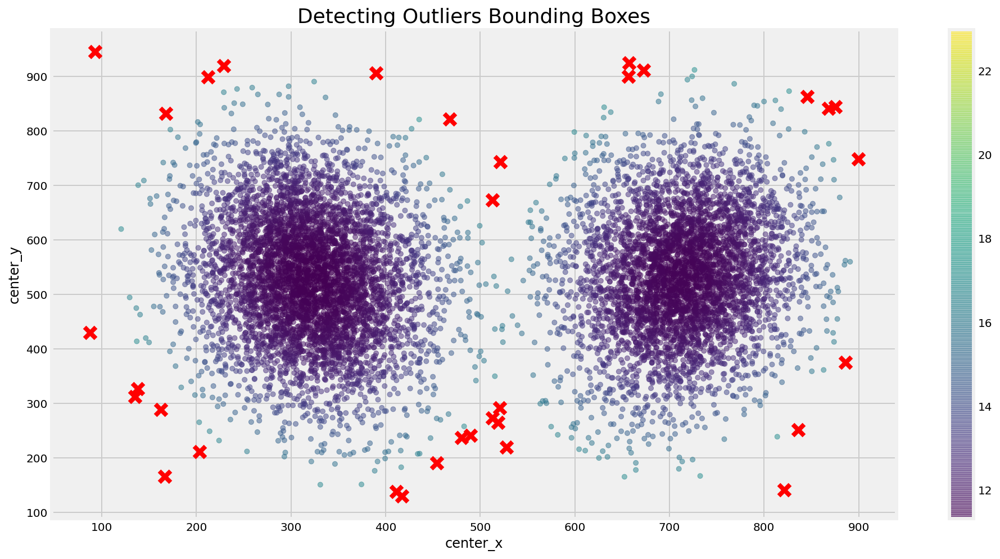

In [ ]:
# GaussianMixture for clustering 
from sklearn.mixture import GaussianMixture
clf = GaussianMixture(n_components=2)
clf.fit(centers[['center_x', 'center_y']])
center_probs = clf.predict_proba(centers[['center_x', 'center_y']])
Z = -clf.score_samples(centers[['center_x', 'center_y']])
outliers = centers.iloc[Z > 17]
fig, ax = plt.subplots(figsize=(15,8))
centers.plot.scatter('center_x', 'center_y', c=Z, alpha=0.5, cmap='viridis', ax=ax)
outliers.plot.scatter('center_x', 'center_y', c='red', marker='x', s=100, ax=ax)
_ = ax.set_title('Detecting Outliers Bounding Boxes', fontsize=18)

>**Observation:-**
1. We can observe that the central area of both the lungs are highly dense, having maximum numbers of bounding box centroids.
2. As soon as we are moving away from the centre, the bounding box density is gradually decreasing.
3. The red crosses that we can see on the outskerts of the lungs are outliers.
4. By removing those outlier values, we can get rid of the effect of outliers.

#### 4.2 Aspect ration vs Area

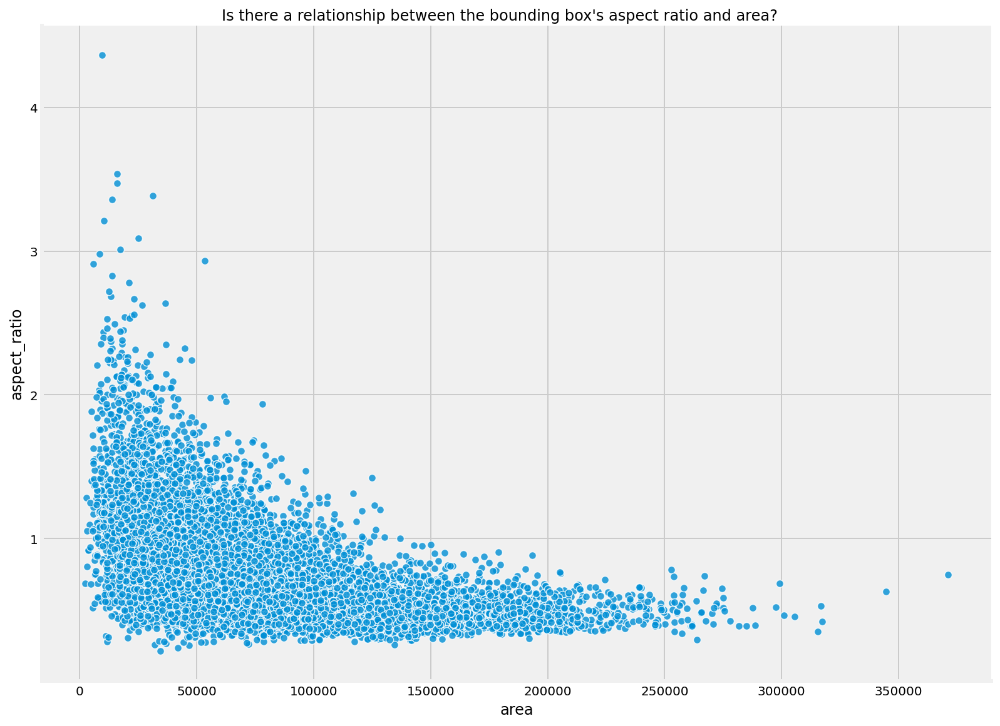

In [ ]:
g = sns.relplot(x='area', y='aspect_ratio', 
            data=train_data.dropna(subset=['area', 'aspect_ratio']), 
            height=8, alpha=0.8, aspect=1.4,)
g.fig.suptitle("The relationship between the bounding box's aspect ratio and area", y=1.005)

>**Observation:-**
1. The plot depicts an inversly prportional relation between the bounding aspect ratio and area.
2. As soon as the aspect ratio is increasing the area is decreasingnad vice-versa.
3. The bounding boxes having maximum heights  have small width & vise-varsa.
4. There are certain bounding boxes having very high apsect ratios.<br>

**---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------**

# Feature Engineering & Modelling

## Preprocessing

In [14]:
import pydicom as dicom
import os
import cv2
import PIL # optional
from tqdm import tqdm
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.applications.densenet import DenseNet121
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense
from sklearn.metrics import f1_score,roc_auc_score
from tensorflow.keras.utils import plot_model,to_categorical
from tensorflow.keras.initializers import he_normal,glorot_normal
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Input, Dense, Flatten, Conv2D,MaxPool2D,Dropout,BatchNormalization
from tensorflow.keras.callbacks import TensorBoard,ModelCheckpoint
import albumentations as A
import datetime

In [15]:
import random
import cv2
from matplotlib import pyplot as plt
 
import numpy as np

In [ ]:
# to covert dicom files to im images
def dicom_to_jpg(source_folder,destination_folder,labels):
    images_path = os.listdir(source_folder)
    image_dirs_label = {'image_dir':[],'Target':[]}
    for n, image in tqdm(enumerate(images_path)):
        ds = dicom.dcmread(os.path.join(source_folder, image))
        pixel_array_numpy = ds.pixel_array
        image = image.replace('.dcm', '.jpg')
        cv2.imwrite(os.path.join(destination_folder, image), pixel_array_numpy)
        image_dirs_label['image_dir'].append(os.path.join(destination_folder, image))
        image_dirs_label['Target'].append(train_labels[train_labels.patientId== image.split('.')[0]].Target.values[0])
    print('{} dicom files converted to jpg!'.format(len(images_path)))
    return pd.DataFrame(image_dirs_label)

In [16]:
# function to calculate recall
# refernce https://datascience.stackexchange.com/a/45166
def recall_m(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
        recall = true_positives / (possible_positives + K.epsilon())
        return recall

# function to calculate precision
def precision_m(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
        precision = true_positives / (predicted_positives + K.epsilon())
        return precision

# function to calculate micro averaged f1_score
def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

In [ ]:
# to visualize images
def visualize(image):
    plt.figure(figsize=(10, 10))
    plt.axis('off')
    plt.imshow(image)


In [ ]:
# image transformer object
transform = A.Compose([
        A.RandomRotate90(),
        A.Flip(),
        A.Transpose(),
        A.OneOf([
            A.IAAAdditiveGaussianNoise(),
            A.GaussNoise(),
        ], p=0.2),
        A.OneOf([
            A.MotionBlur(p=.2),
            A.MedianBlur(blur_limit=3, p=0.1),
            A.Blur(blur_limit=3, p=0.1),
        ], p=0.2),
        A.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.2, rotate_limit=45, p=0.2),
        A.OneOf([
            A.OpticalDistortion(p=0.3),
            A.GridDistortion(p=.1),
            A.IAAPiecewiseAffine(p=0.3),
        ], p=0.2),
        A.OneOf([
            A.CLAHE(clip_limit=2),
            A.IAASharpen(),
            A.IAAEmboss(),
            A.RandomBrightnessContrast(),            
        ], p=0.3),
        A.HueSaturationValue(p=0.3),
    ])

In [ ]:
# minor class image augmentor function
def augment_oversample(dir_labels_df,minority_class,transformer,sampling_ratio):
    augmented_labels = {'image_dir':[],'Target':[]}
    for i in tqdm(range(len(dir_labels_df))):
        directory = dir_labels_df.loc[i,'image_dir']
        target = dir_labels_df.loc[i,'Target']
        if target == minority_class:
            image = cv2.imread(directory)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            name = directory.split('\\')[-1]
            for j in range(sampling_ratio):
                augmented_image = transform(image=image)['image']
                temp = ('\\').join(directory.split('\\')[:-1])
                temp = temp + '\\augmented'
                cv2.imwrite(os.path.join(temp,str(j) + '_' + name),augmented_image)
                augmented_labels['image_dir']=os.path.join(temp,str(j) + '_' + name)
                augmented_labels['Target']=minority_class
    return pd.DataFrame(augmented_labels)

In [ ]:
# reading train labels & removing duplicates
train_data = pd.read_csv('data/stage_2_train_labels.csv')
train_labels = train_data[['patientId','Target']].drop_duplicates()
train_labels.to_csv('data/train_labels.csv',index=False)

In [ ]:
# converting dicoms to images
train_dirs_label = dicom_to_jpg("data\\stage_2_train_images","data\\train_jpg_images",train_labels)

26684it [23:00, 19.33it/s]

26684 dicom files converted to jpg!


In [ ]:
#train_dirs_label.to_csv('data/train_dirs_label.csv',index=False)
train_dirs_label = pd.read_csv('data/train_dirs_label.csv')

In [ ]:
# augmenting minority class images & getting dirtectory_label dataframe
augmented_dir_label = augment_oversample(train_dirs_label,1,transform,4)
augmented_dir_label = pd.DataFrame(augmented_dir_label)
augmented_dir_label.to_csv('data\\augmented_dir_label.csv',index=False)

In [ ]:
# concatinating true tabels with augmented labels
true_augmented_labels = pd.concat([train_dirs_label,augmented_dir_label],ignore_index=True,axis=0)
true_augmented_labels.to_csv('data/true_augmented_labels.csv',index=False)

In [ ]:
true_augmented_labels = pd.read_csv('data/true_augmented_labels.csv')

## Classification Model (ChexNet i.e DensNet121)

In [ ]:
# reading path_label csv
true_augmented_labels = pd.read_csv('data/true_augmented_labels.csv',dtype='str')

# shuffeling 
true_augmented_labels = true_augmented_labels.sample(frac = 1)


datagen=ImageDataGenerator(
        rescale=1./255.,
        validation_split=0.20)

train_generator=datagen.flow_from_dataframe(
dataframe=true_augmented_labels,
x_col="image_dir",
y_col="Target",
subset="training",
batch_size=4,
seed=42,
shuffle=True,
class_mode="binary",
target_size=(416,416))

valid_generator=datagen.flow_from_dataframe(
dataframe=true_augmented_labels,
x_col="image_dir",
y_col="Target",
subset="validation",
batch_size=4,
seed=42,
shuffle=True,
class_mode="binary",
target_size=(416,416))

Found 40586 validated image filenames belonging to 2 classes.
Found 10146 validated image filenames belonging to 2 classes.


In [17]:
# setting up base model 
dense_net_121 = DenseNet121(input_shape=[416,416] + [3],include_top=False,pooling='avg')
base_model_output = Dense(units=14,activation='relu')(dense_net_121.output)
base_model = Model(inputs = dense_net_121.input,outputs=base_model_output)
base_model.load_weights('brucechou1983_CheXNet_Keras_0.3.0_weights.h5')

In [18]:
# freezing initial layers of base model
for layer in base_model.layers[:10]:
    layer.trainable = False

In [19]:
base_model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 416, 416, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 422, 422, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 208, 208, 64) 9408        zero_padding2d[0][0]             
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 208, 208, 64) 256         conv1/conv[0][0]                 
_______________________________________________________________________________________

In [20]:
# setting up final model 
output_layer = Dense(1,activation='sigmoid')(base_model.layers[-2].output)
model = Model(inputs=base_model.inputs, outputs=output_layer)
model.compile(optimizer='adam', loss='binary_crossentropy',metrics = ['accuracy',f1_m])

In [13]:
model.summary()

Model: "functional_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 416, 416, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 422, 422, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 208, 208, 64) 9408        zero_padding2d[0][0]             
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 208, 208, 64) 256         conv1/conv[0][0]                 
_______________________________________________________________________________________

In [ ]:
# setting up callbacks
checkpoint = ModelCheckpoint(filepath='classifier_weights.hdf5', monitor='val_accuracy',  verbose=0, save_best_only=True,save_weights_only=True, mode='auto')
log_dir="classifier_logs/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard= TensorBoard(log_dir=log_dir, histogram_freq=1, write_graph=True,write_grads=True)
callback_list = [checkpoint,tensorboard]

In [ ]:
import warnings
warnings.filterwarnings("ignore")
# fit the model
model.fit(train_generator,
  validation_data=valid_generator,
  epochs=3,
  steps_per_epoch=len(train_generator),
  callbacks=callback_list)

Epoch 1/3
    1/10147 [..............................] - ETA: 1:00 - loss: 0.6873 - accuracy: 0.5000 - f1_m: 0.6667WARNING:tensorflow:From C:\ProgramData\Anaconda3\lib\site-packages\tensorflow\python\ops\summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.
10147/10147 [==============================] - 3729s 368ms/step - loss: 0.3043 - accuracy: 0.8632 - f1_m: 0.8468 - val_loss: 0.2725 - val_accuracy: 0.8746 - val_f1_m: 0.8574
Epoch 2/3
10147/10147 [==============================] - 3728s 367ms/step - loss: 0.2657 - accuracy: 0.8806 - f1_m: 0.8586 - val_loss: 0.2705 - val_accuracy: 0.8774 - val_f1_m: 0.8618
Epoch 3/3
10147/10147 [==============================] - 3728s 367ms/step - loss: 0.2500 - accuracy: 0.8888 - f1_m: 0.8624 - val_loss: 0.2554 - val_accuracy: 0.8832 - val_f1_m: 0.8658


In [ ]:
# loading model 
model = tf.keras.models.load_model('models and weights/chexnet_model.hdf5',custom_objects={'f1_m':f1_m})
# loading weights
model.load_weights('models and weights/classifier_weights.hdf5')

In [21]:
# saving model
model.save('models and weights/chexnet_model.hdf5')

### Accuracy vs epoch plot
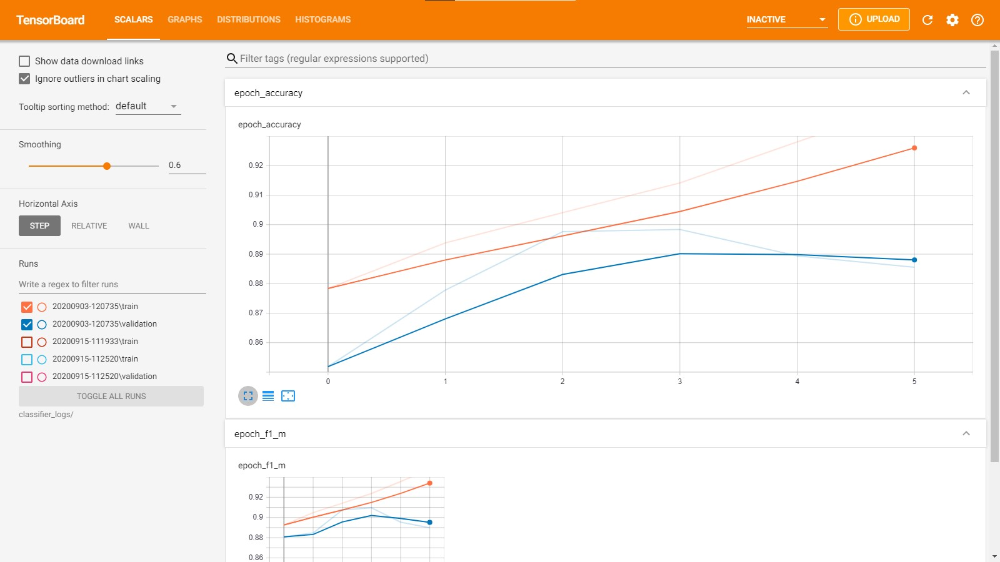

### f1_score vs epoch plot
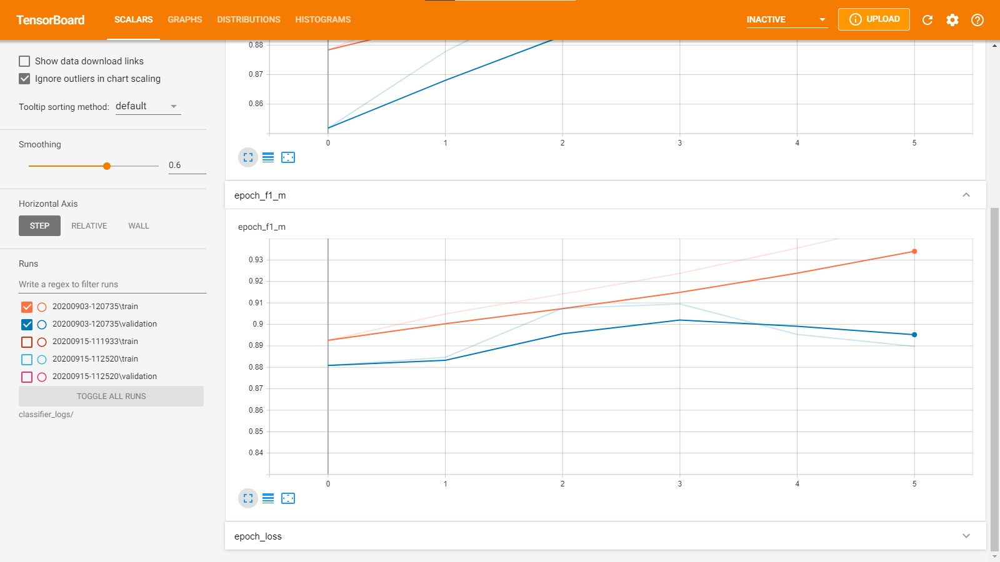

### loss vs epoch plot
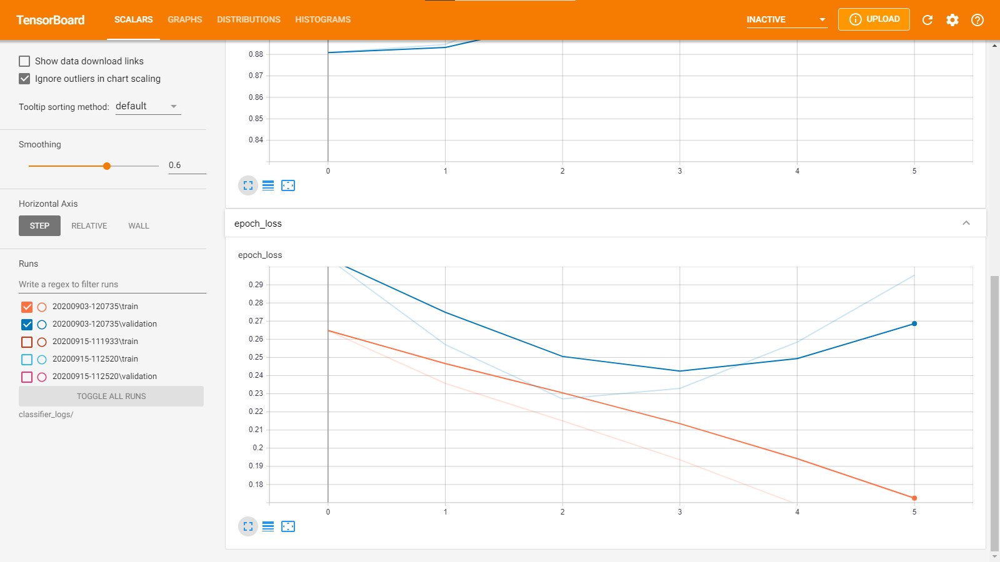

## Approach & Summary:-

1. As there is huge imbalance, we agumented images of minority class & generated 4 augmented images per minority class image.
2. we used pretrained ChexNet architecture initialized with trained weights by removing top layers to make it binary classifier.
3. We freezed initial 10 layers of pretrained model for training & enabled remaining layers for training.
4. Total epochs we used is 6 but after 3rd epoch the model performance start degrading.
5. The best model perfomance we got is **val_loss: 0.2554 - val_accuracy: 0.8832 - val_f1_m: 0.8658** at 3rd epoch.

# YoloV3 Model (With ChexNet Backbone)

## 1. XML Annotation generator

In [ ]:
import xml.etree.ElementTree as et
import tqdm
def to_xml(id,data):  
    annotation = et.Element("annotation") 
    filename = et.SubElement(annotation, "filename") 
    filename.text = id + '.jpg'

    size = et.SubElement(annotation, "size") 
    width = et.SubElement(size, "width") 
    width.text = '1024'
    height = et.SubElement(size, "height") 
    height.text = '1024'
    depth = et.SubElement(size, "depth") 
    depth.text = '3'
    if len(data)==1 and data.Target.values[0] == 0 :
        obj = et.SubElement(annotation, "object") 
        name = et.SubElement(obj, "name") 
        name.text = 'no_opacity'
        bndbox = et.SubElement(obj, "bndbox") 
        xmin = et.SubElement(bndbox, "xmin") 
        xmin.text = '0'
        ymin = et.SubElement(bndbox, "ymin") 
        ymin.text = '0'
        xmax = et.SubElement(bndbox, "xmax") 
        xmax.text = '0'
        ymax = et.SubElement(bndbox, "ymax") 
        ymax.text = '0'
    else:
        for _,row in data.iterrows():
            obj = et.SubElement(annotation, "object") 
            name = et.SubElement(obj, "name") 
            name.text = 'opacity'
            bndbox = et.SubElement(obj, "bndbox") 
            xmin = et.SubElement(bndbox, "xmin") 
            xmin.text = str(row['x'])
            ymin = et.SubElement(bndbox, "ymin") 
            ymin.text = str(row['y'])
            xmax = et.SubElement(bndbox, "xmax") 
            xmax.text = str(row['x'] + row['width'])
            ymax = et.SubElement(bndbox, "ymax") 
            ymax.text = str(row['y'] + row['height'])
    tree = et.ElementTree(annotation) 
    with open ('/content/drive/My Drive/RSNA_VOC/Annotations/' + id +'.xml' , "wb") as files : 
        tree.write(files) 

## 2.TF-record generator 

In [ ]:
import time
import os
import hashlib
import tensorflow as tf
import lxml.etree
import tqdm

data_dir = '/content/drive/My Drive/RSNA_VOC/'
split = 'train'
output_file = '/content/drive/My Drive/RSNA_VOC/Generated/rsna_train.tfrecord'
classes = '/content/drive/My Drive/RSNA_VOC/RSNA_VOC.names'


def build_example(annotation, class_map, data_dir):
    img_path = os.path.join(
        data_dir, 'JPG_train', annotation['filename'])
    img_raw = open(img_path, 'rb').read()
    key = hashlib.sha256(img_raw).hexdigest()

    width = int(annotation['size']['width'])
    height = int(annotation['size']['height'])

    xmin = []
    ymin = []
    xmax = []
    ymax = []
    classes = []
    classes_text = []
    if 'object' in annotation:
        for obj in annotation['object']:
            xmin.append(float(obj['bndbox']['xmin']) / width)
            ymin.append(float(obj['bndbox']['ymin']) / height)
            xmax.append(float(obj['bndbox']['xmax']) / width)
            ymax.append(float(obj['bndbox']['ymax']) / height)
            classes_text.append(obj['name'].encode('utf8'))
            classes.append(class_map[obj['name']])
            
    example = tf.train.Example(features=tf.train.Features(feature={
        'image/height': tf.train.Feature(int64_list=tf.train.Int64List(value=[height])),
        'image/width': tf.train.Feature(int64_list=tf.train.Int64List(value=[width])),
        'image/filename': tf.train.Feature(bytes_list=tf.train.BytesList(value=[
            annotation['filename'].encode('utf8')])),
        'image/source_id': tf.train.Feature(bytes_list=tf.train.BytesList(value=[
            annotation['filename'].encode('utf8')])),
        'image/key/sha256': tf.train.Feature(bytes_list=tf.train.BytesList(value=[key.encode('utf8')])),
        'image/encoded': tf.train.Feature(bytes_list=tf.train.BytesList(value=[img_raw])),
        'image/format': tf.train.Feature(bytes_list=tf.train.BytesList(value=['jpeg'.encode('utf8')])),
        'image/object/bbox/xmin': tf.train.Feature(float_list=tf.train.FloatList(value=xmin)),
        'image/object/bbox/xmax': tf.train.Feature(float_list=tf.train.FloatList(value=xmax)),
        'image/object/bbox/ymin': tf.train.Feature(float_list=tf.train.FloatList(value=ymin)),
        'image/object/bbox/ymax': tf.train.Feature(float_list=tf.train.FloatList(value=ymax)),
        'image/object/class/text': tf.train.Feature(bytes_list=tf.train.BytesList(value=classes_text)),
        'image/object/class/label': tf.train.Feature(int64_list=tf.train.Int64List(value=classes)),
    }))
    return example


def parse_xml(xml):
    if not len(xml):
        return {xml.tag: xml.text}
    result = {}
    for child in xml:
        child_result = parse_xml(child)
        if child.tag != 'object':
            result[child.tag] = child_result[child.tag]
        else:
            if child.tag not in result:
                result[child.tag] = []
            result[child.tag].append(child_result[child.tag])
    return {xml.tag: result}


def tf_record_gen(data_dir = '/content/drive/My Drive/RSNA_VOC/',
                  split= 'train',
                  output_file = '/content/drive/My Drive/RSNA_VOC/Generated/rsna_train.tfrecord',
                  classes= '/content/drive/My Drive/RSNA_VOC/RSNA_VOC.names'):
    
    class_map = {name: idx for idx, name in enumerate(
        open(classes).read().splitlines())}
    print("Class mapping loaded: %s", class_map)

    writer = tf.io.TFRecordWriter(output_file)
    image_list = open(os.path.join(
        data_dir, 'ImageSets', 'Main', '%s.txt' % split)).read().splitlines()
    print("Image list loaded: %d", len(image_list))
    for name in tqdm.tqdm(image_list):
        annotation_xml = os.path.join(
            data_dir, 'Annotations', name + '.xml')
        annotation_xml = lxml.etree.fromstring(open(annotation_xml).read())
        annotation = parse_xml(annotation_xml)['annotation']
        tf_example = build_example(annotation, class_map,data_dir)
        writer.write(tf_example.SerializeToString())
    writer.close()
    print("Done")

In [ ]:
tf_record_gen(split='train',output_file='./data/rsna_train_temp.tfrecord')

In [ ]:
tf_record_gen(split='val',output_file='./data/rsna_val_temp.tfrecord')

100%|███████████████████████████████████████████████████████████████████████████████| 602/602 [00:05<00:00, 116.44it/s]


## 3.Anchor Generator

In [ ]:
import pandas as pd
import numpy as np
import math
def get_x_mid(row):
    if not math.isnan(row[1]):
        x_mid = row[1]+row[3]/2
        return x_mid
    else:
        return None
    
def get_y_mid(row):
    if not math.isnan(row[2]):
        y_mid = row[2]+row[4]/2
        return y_mid
    else:
        return None

train_data = pd.read_csv('stage_2_train_labels.csv')
train_data['x_mid'] = train_data.apply(get_x_mid,axis=1)
train_data['y_mid'] = train_data.apply(get_y_mid,axis=1)
positive = train_data[train_data.Target.values == 1]
positive_id = positive.patientId.unique()

In [ ]:
from tqdm import tqdm
for i in tqdm(positive_id):
    t = train_data[train_data.patientId == i][['x_mid','y_mid','width','height']]
    t['class'] = 0
    t = t[['class','x_mid','y_mid','width','height']].values / 1024
    if not os.path.exists('text_files'):
        os.mkdir('text_files')
    np.savetxt('text_files/' + i + '.txt',t,fmt='%s')

100%|██████████| 6012/6012 [00:34<00:00, 175.58it/s]


In [ ]:
'''
https://github.com/AlexeyAB/darknet/blob/master/scripts/gen_anchors.py
Created on Feb 20, 2017
@author: jumabek
'''
from os import listdir
from os.path import isfile, join
import argparse
import numpy as np
import sys
import os
import shutil
import random 
import math

width_in_cfg_file = 416.
height_in_cfg_file = 416.

def IOU(x,centroids):
    similarities = []
    k = len(centroids)
    for centroid in centroids:
        c_w,c_h = centroid
        w,h = x
        if c_w>=w and c_h>=h:
            similarity = w*h/(c_w*c_h)
        elif c_w>=w and c_h<=h:
            similarity = w*c_h/(w*h + (c_w-w)*c_h)
        elif c_w<=w and c_h>=h:
            similarity = c_w*h/(w*h + c_w*(c_h-h))
        else: #means both w,h are bigger than c_w and c_h respectively
            similarity = (c_w*c_h)/(w*h)
        similarities.append(similarity) # will become (k,) shape
    return np.array(similarities) 

def avg_IOU(X,centroids):
    n,d = X.shape
    sum = 0.
    for i in range(X.shape[0]):
        #note IOU() will return array which contains IoU for each centroid and X[i] // slightly ineffective, but I am too lazy
        sum+= max(IOU(X[i],centroids)) 
    return sum/n

def write_anchors_to_file(centroids,X,anchor_file):
    f = open(anchor_file,'w')
    
    anchors = centroids.copy()
    print(anchors.shape)

    for i in range(anchors.shape[0]):
        anchors[i][0]*=width_in_cfg_file/32.
        anchors[i][1]*=height_in_cfg_file/32.
         

    widths = anchors[:,0]
    sorted_indices = np.argsort(widths)

    print('Anchors = ', anchors[sorted_indices])
        
    for i in sorted_indices[:-1]:
        f.write('%0.2f,%0.2f, '%(anchors[i,0],anchors[i,1]))

    #there should not be comma after last anchor, that's why
    f.write('%0.2f,%0.2f\n'%(anchors[sorted_indices[-1:],0],anchors[sorted_indices[-1:],1]))
    
    f.write('%f\n'%(avg_IOU(X,centroids)))
    print()

def kmeans(X,centroids,eps,anchor_file):
    
    N = X.shape[0]
    iterations = 0
    k,dim = centroids.shape
    prev_assignments = np.ones(N)*(-1)    
    iter = 0
    old_D = np.zeros((N,k))

    while True:
        D = [] 
        iter+=1           
        for i in range(N):
            d = 1 - IOU(X[i],centroids)
            D.append(d)
        D = np.array(D) # D.shape = (N,k)
        
        print("iter {}: dists = {}".format(iter,np.sum(np.abs(old_D-D))))
            
        #assign samples to centroids 
        assignments = np.argmin(D,axis=1)
        
        if (assignments == prev_assignments).all() :
            print("Centroids = ",centroids)
            write_anchors_to_file(centroids,X,anchor_file)
            return

        #calculate new centroids
        centroid_sums=np.zeros((k,dim),np.float)
        for i in range(N):
            centroid_sums[assignments[i]]+=X[i]        
        for j in range(k):            
            centroids[j] = centroid_sums[j]/(np.sum(assignments==j))
        
        prev_assignments = assignments.copy()     
        old_D = D.copy()  

def anchor_generator(filelist,output_dir,num_clusters):

    if not os.path.exists(output_dir):
        os.mkdir(output_dir)

    f = open(filelist)
  
    lines = [line.rstrip('\n') for line in f.readlines()]
    
    annotation_dims = []

    size = np.zeros((1,1,3))
    for line in lines:
        f2 = open('text_files/' + line + '.txt')
        for line in f2.readlines():
            line = line.rstrip('\n')
            w,h = line.split(' ')[3:]            
            #print(w,h)
            annotation_dims.append(tuple(map(float,(w,h))))
    annotation_dims = np.array(annotation_dims)
  
    eps = 0.005
    
    if num_clusters == 0:
        for num_clusters in range(1,11): #we make 1 through 10 clusters 
            anchor_file = join( output_dir,'anchors%d.txt'%(num_clusters))

            indices = [random.randrange(annotation_dims.shape[0]) for i in range(num_clusters)]
            centroids = annotation_dims[indices]
            kmeans(annotation_dims,centroids,eps,anchor_file)
            print('centroids.shape', centroids.shape)
    else:
        anchor_file = join( output_dir,'anchors%d.txt'%(num_clusters))
        indices = [random.randrange(annotation_dims.shape[0]) for i in range(num_clusters)]
        centroids = annotation_dims[indices]
        kmeans(annotation_dims,centroids,eps,anchor_file)
        print('centroids.shape', centroids.shape)

In [ ]:
anchor_generator(filelist='/content/file_list.txt',
                 output_dir='/content/generated_anchors',
                 num_clusters=9)

iter 1: dists = 44815.35613970203
iter 2: dists = 3052.4866410091136
iter 3: dists = 1304.5340328104628
iter 4: dists = 924.0739023809834
iter 5: dists = 775.8404343494562
iter 6: dists = 710.9594641400898
iter 7: dists = 581.5749920570671
iter 8: dists = 555.5357585566653
iter 9: dists = 478.2774691306894
iter 10: dists = 432.2759975106657
iter 11: dists = 394.935918480509
iter 12: dists = 395.565457439982
iter 13: dists = 357.51334158202167
iter 14: dists = 311.0223714222358
iter 15: dists = 313.24983013502055
iter 16: dists = 284.6643063139667
iter 17: dists = 289.17116583402486
iter 18: dists = 267.6880149453517
iter 19: dists = 271.9698990429869
iter 20: dists = 232.43241560096533
iter 21: dists = 196.90181488959868
iter 22: dists = 171.58477753846176
iter 23: dists = 158.01578963581298
iter 24: dists = 164.53256314211777
iter 25: dists = 170.21325411791514
iter 26: dists = 159.82465755145174
iter 27: dists = 125.41814356481134
iter 28: dists = 102.77873131301804
iter 29: dists = 

## 4.Utility functions 

In [1]:
# reference :-  https://github.com/zzh8829/yolov3-tf2

import tensorflow as tf
from absl import logging
import numpy as np
import tensorflow as tf
import cv2

@tf.function
def transform_targets_for_output(y_true, grid_size, anchor_idxs):
    # y_true: (N, boxes, (x1, y1, x2, y2, class, best_anchor))
    N = tf.shape(y_true)[0]

    # y_true_out: (N, grid, grid, anchors, [x, y, w, h, obj, class])
    y_true_out = tf.zeros(
        (N, grid_size, grid_size, tf.shape(anchor_idxs)[0], 6))

    anchor_idxs = tf.cast(anchor_idxs, tf.int32)

    indexes = tf.TensorArray(tf.int32, 1, dynamic_size=True)
    updates = tf.TensorArray(tf.float32, 1, dynamic_size=True)
    idx = 0
    for i in tf.range(N):
        for j in tf.range(tf.shape(y_true)[1]):
            if tf.equal(y_true[i][j][2], 0):
                continue
            anchor_eq = tf.equal(
                anchor_idxs, tf.cast(y_true[i][j][5], tf.int32))

            if tf.reduce_any(anchor_eq):
                box = y_true[i][j][0:4]
                box_xy = (y_true[i][j][0:2] + y_true[i][j][2:4]) / 2

                anchor_idx = tf.cast(tf.where(anchor_eq), tf.int32)
                grid_xy = tf.cast(box_xy // (1/grid_size), tf.int32)

                # grid[y][x][anchor] = (tx, ty, bw, bh, obj, class)
                indexes = indexes.write(
                    idx, [i, grid_xy[1], grid_xy[0], anchor_idx[0][0]])
                updates = updates.write(
                    idx, [box[0], box[1], box[2], box[3], 1, y_true[i][j][4]])
                idx += 1

    # tf.print(indexes.stack())
    # tf.print(updates.stack())

    return tf.tensor_scatter_nd_update(
        y_true_out, indexes.stack(), updates.stack())


def transform_targets(y_train, anchors, anchor_masks, size):
    y_outs = []
    grid_size = size // 32

    # calculate anchor index for true boxes
    anchors = tf.cast(anchors, tf.float32)
    anchor_area = anchors[..., 0] * anchors[..., 1]
    box_wh = y_train[..., 2:4] - y_train[..., 0:2]
    box_wh = tf.tile(tf.expand_dims(box_wh, -2),
                     (1, 1, tf.shape(anchors)[0], 1))
    box_area = box_wh[..., 0] * box_wh[..., 1]
    intersection = tf.minimum(box_wh[..., 0], anchors[..., 0]) * \
        tf.minimum(box_wh[..., 1], anchors[..., 1])
    iou = intersection / (box_area + anchor_area - intersection)
    anchor_idx = tf.cast(tf.argmax(iou, axis=-1), tf.float32)
    anchor_idx = tf.expand_dims(anchor_idx, axis=-1)

    y_train = tf.concat([y_train, anchor_idx], axis=-1)

    for anchor_idxs in anchor_masks:
        y_outs.append(transform_targets_for_output(
            y_train, grid_size, anchor_idxs))
        grid_size *= 2

    return tuple(y_outs)


def transform_images(x_train, size):
    x_train = tf.image.resize(x_train, (size, size))
    x_train = x_train / 255
    return x_train


# https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/using_your_own_dataset.md#conversion-script-outline-conversion-script-outline
# Commented out fields are not required in our project
IMAGE_FEATURE_MAP = {
    'image/encoded': tf.io.FixedLenFeature([], tf.string),
    'image/object/bbox/xmin': tf.io.VarLenFeature(tf.float32),
    'image/object/bbox/ymin': tf.io.VarLenFeature(tf.float32),
    'image/object/bbox/xmax': tf.io.VarLenFeature(tf.float32),
    'image/object/bbox/ymax': tf.io.VarLenFeature(tf.float32),
    'image/object/class/text': tf.io.VarLenFeature(tf.string),
}


def parse_tfrecord(tfrecord, class_table, size):
    global yolo_max_boxes
    x = tf.io.parse_single_example(tfrecord, IMAGE_FEATURE_MAP)
    x_train = tf.image.decode_jpeg(x['image/encoded'], channels=3)
    x_train = tf.image.resize(x_train, (size, size))

    class_text = tf.sparse.to_dense(
        x['image/object/class/text'], default_value='')
    labels = tf.cast(class_table.lookup(class_text), tf.float32)
    y_train = tf.stack([tf.sparse.to_dense(x['image/object/bbox/xmin']),
                        tf.sparse.to_dense(x['image/object/bbox/ymin']),
                        tf.sparse.to_dense(x['image/object/bbox/xmax']),
                        tf.sparse.to_dense(x['image/object/bbox/ymax']),
                        labels], axis=1)

    paddings = [[0, yolo_max_boxes - tf.shape(y_train)[0]], [0, 0]]
    y_train = tf.pad(y_train, paddings)

    return x_train, y_train


def load_tfrecord_dataset(file_pattern, class_file, size=416):
    '''file_pattern --> path to tf-record file
        class_file --> file containing classes
        size --> image size'''
    LINE_NUMBER = -1  # TODO: use tf.lookup.TextFileIndex.LINE_NUMBER
    class_table = tf.lookup.StaticHashTable(tf.lookup.TextFileInitializer(
        class_file, tf.string, 0, tf.int64, LINE_NUMBER, delimiter="\n"), -1)

    files = tf.data.Dataset.list_files(file_pattern)
    dataset = files.flat_map(tf.data.TFRecordDataset)
    return dataset.map(lambda x: parse_tfrecord(x, class_table, size))


def load_fake_dataset():
    x_train = tf.image.decode_jpeg(
        open('./data/girl.png', 'rb').read(), channels=3)
    x_train = tf.expand_dims(x_train, axis=0)

    labels = [
        [0.18494931, 0.03049111, 0.9435849,  0.96302897, 0],
        [0.01586703, 0.35938117, 0.17582396, 0.6069674, 56],
        [0.09158827, 0.48252046, 0.26967454, 0.6403017, 67]
    ] + [[0, 0, 0, 0, 0]] * 5
    y_train = tf.convert_to_tensor(labels, tf.float32)
    y_train = tf.expand_dims(y_train, axis=0)

    return tf.data.Dataset.from_tensor_slices((x_train, y_train))



YOLOV3_LAYER_LIST = [
    'yolo_darknet',
    'yolo_conv_0',
    'yolo_output_0',
    'yolo_conv_1',
    'yolo_output_1',
    'yolo_conv_2',
    'yolo_output_2',
]

YOLOV3_TINY_LAYER_LIST = [
    'yolo_darknet',
    'yolo_conv_0',
    'yolo_output_0',
    'yolo_conv_1',
    'yolo_output_1',
]


def load_darknet_weights(model, weights_file, tiny=False):
    wf = open(weights_file, 'rb')
    major, minor, revision, seen, _ = np.fromfile(wf, dtype=np.int32, count=5)

    if tiny:
        layers = YOLOV3_TINY_LAYER_LIST
    else:
        layers = YOLOV3_LAYER_LIST

    for layer_name in layers:
        sub_model = model.get_layer(layer_name)
        for i, layer in enumerate(sub_model.layers):
            if not layer.name.startswith('conv2d'):
                continue
            batch_norm = None
            if i + 1 < len(sub_model.layers) and \
                    sub_model.layers[i + 1].name.startswith('batch_norm'):
                batch_norm = sub_model.layers[i + 1]

            logging.info("{}/{} {}".format(
                sub_model.name, layer.name, 'bn' if batch_norm else 'bias'))

            filters = layer.filters
            size = layer.kernel_size[0]
            in_dim = layer.get_input_shape_at(0)[-1]

            if batch_norm is None:
                conv_bias = np.fromfile(wf, dtype=np.float32, count=filters)
            else:
                # darknet [beta, gamma, mean, variance]
                bn_weights = np.fromfile(
                    wf, dtype=np.float32, count=4 * filters)
                # tf [gamma, beta, mean, variance]
                bn_weights = bn_weights.reshape((4, filters))[[1, 0, 2, 3]]

            # darknet shape (out_dim, in_dim, height, width)
            conv_shape = (filters, in_dim, size, size)
            conv_weights = np.fromfile(
                wf, dtype=np.float32, count=np.product(conv_shape))
            # tf shape (height, width, in_dim, out_dim)
            conv_weights = conv_weights.reshape(
                conv_shape).transpose([2, 3, 1, 0])

            if batch_norm is None:
                layer.set_weights([conv_weights, conv_bias])
            else:
                layer.set_weights([conv_weights])
                batch_norm.set_weights(bn_weights)

    assert len(wf.read()) == 0, 'failed to read all data'
    wf.close()


def broadcast_iou(box_1, box_2):
    # box_1: (..., (x1, y1, x2, y2))
    # box_2: (N, (x1, y1, x2, y2))

    # broadcast boxes
    box_1 = tf.expand_dims(box_1, -2)
    box_2 = tf.expand_dims(box_2, 0)
    # new_shape: (..., N, (x1, y1, x2, y2))
    new_shape = tf.broadcast_dynamic_shape(tf.shape(box_1), tf.shape(box_2))
    box_1 = tf.broadcast_to(box_1, new_shape)
    box_2 = tf.broadcast_to(box_2, new_shape)

    int_w = tf.maximum(tf.minimum(box_1[..., 2], box_2[..., 2]) -
                       tf.maximum(box_1[..., 0], box_2[..., 0]), 0)
    int_h = tf.maximum(tf.minimum(box_1[..., 3], box_2[..., 3]) -
                       tf.maximum(box_1[..., 1], box_2[..., 1]), 0)
    int_area = int_w * int_h
    box_1_area = (box_1[..., 2] - box_1[..., 0]) * \
        (box_1[..., 3] - box_1[..., 1])
    box_2_area = (box_2[..., 2] - box_2[..., 0]) * \
        (box_2[..., 3] - box_2[..., 1])
    return int_area / (box_1_area + box_2_area - int_area)


def draw_outputs(img, outputs, class_names):
    boxes, objectness, classes, nums = outputs
    boxes, objectness, classes, nums = boxes[0], objectness[0], classes[0], nums[0]
    wh = np.flip(img.shape[0:2])
    for i in range(nums):
        x1y1 = tuple((np.array(boxes[i][0:2]) * wh).astype(np.int32))
        x2y2 = tuple((np.array(boxes[i][2:4]) * wh).astype(np.int32))
        img = cv2.rectangle(img, x1y1, x2y2, (255, 0, 0), 2)
        img = cv2.putText(img, '{} {:.4f}'.format(
            class_names[int(classes[i])], objectness[i]),
            x1y1, cv2.FONT_HERSHEY_COMPLEX_SMALL, 1, (0, 0, 255), 2)
    return img


def draw_labels(x, y, class_names):
    img = x.numpy()
    boxes, classes = tf.split(y, (4, 1), axis=-1)
    classes = classes[..., 0]
    wh = np.flip(img.shape[0:2])
    for i in range(len(boxes)):
        x1y1 = tuple((np.array(boxes[i][0:2]) * wh).astype(np.int32))
        x2y2 = tuple((np.array(boxes[i][2:4]) * wh).astype(np.int32))
        img = cv2.rectangle(img, x1y1, x2y2, (255, 0, 0), 2)
        img = cv2.putText(img, class_names[classes[i]],
                          x1y1, cv2.FONT_HERSHEY_COMPLEX_SMALL,
                          1, (0, 0, 255), 2)
    return img


def freeze_all(model, frozen=True):
    model.trainable = not frozen
    if isinstance(model, tf.keras.Model):
        for l in model.layers:
            freeze_all(l, frozen)


## 5. Analysing Transformed Training Data

In [17]:
train_dataset = load_tfrecord_dataset(
             'data/rsna_train_pos.tfrecord',  'data/RSNA_VOC/RSNA_VOC.names',  416)
train_dataset = train_dataset.shuffle(buffer_size=512)
train_dataset = train_dataset.batch(8)
train_dataset = train_dataset.map(lambda x, y: (
                transform_images(x,  416),
                transform_targets(y, yolo_anchors, yolo_anchor_masks,  416)))

In [6]:
img_raw, label = next(iter(train_dataset.take(10)))

In [7]:
img_raw.shape

TensorShape([8, 416, 416, 3])

In [11]:
label[0].shape

TensorShape([8, 13, 13, 3, 6])

In [12]:
label[0][0].shape

TensorShape([13, 13, 3, 6])

In [13]:
label[0][0][0].shape

TensorShape([13, 3, 6])

In [14]:
# grid row with no opacity
label[0][0][0]

<tf.Tensor: shape=(13, 3, 6), dtype=float32, numpy=
array([[[0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.]],

       [[0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.]],

       [[0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.]],

       [[0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.]],

       [[0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.]],

       [[0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.]],

       [[0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.]],

       [[0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.]],

       [[0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.]],

       [[0.,

In [18]:
# grid row with opacity 
label[0][0][4]

<tf.Tensor: shape=(13, 3, 6), dtype=float32, numpy=
array([[[0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        ]],

       [[0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        ]],

       [[0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        ]],

       [[0.        , 0.        , 0.        , 0.        , 0.        ,
         0.        ],
        [0.        , 0.        ,


## 6 .Model

In [2]:
# refernce :- https://github.com/zzh8829/yolov3-tf2
from absl import flags
from absl.flags import FLAGS
import numpy as np
import tensorflow as tf
from tensorflow.keras import Model
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.layers import (
    Add,
    Concatenate,
    Conv2D,
    Input,
    Lambda,
    LeakyReLU,
    MaxPool2D,
    UpSampling2D,
    ZeroPadding2D,
    BatchNormalization,
    Dense
)
from tensorflow.keras.regularizers import l2
from tensorflow.keras.losses import (
    binary_crossentropy,
    sparse_categorical_crossentropy
)

yolo_max_boxes = 5
yolo_iou_threshold = 0.5
yolo_score_threshold = 0.2


yolo_anchors =  np.array([(1.64126859, 1.57735626),
(1.95796131, 2.82720657),
 (2.34064143, 4.15636709),
 (2.56204603, 1.98776336),
 (2.74322473, 6.06700881),
 (3.05649982, 3.01837452),
 (3.35012271, 4.36147404),
 (3.62680934, 6.1833571),
 (3.79945951, 8.18022062)], np.float32)/416

yolo_anchor_masks = np.array([[6, 7, 8], [3, 4, 5], [0, 1, 2]])


yolo_tiny_anchors = np.array([(10, 14), (23, 27), (37, 58),
                              (81, 82), (135, 169),  (344, 319)],
                             np.float32) / 416
yolo_tiny_anchor_masks = np.array([[3, 4, 5], [0, 1, 2]])


def DarknetConv(x, filters, size, strides=1, batch_norm=True):
    if strides == 1:
        padding = 'same'
    else:
        x = ZeroPadding2D(((1, 0), (1, 0)))(x)  # top left half-padding
        padding = 'valid'
    x = Conv2D(filters=filters, kernel_size=size,
               strides=strides, padding=padding,
               use_bias=not batch_norm, kernel_regularizer=l2(0.0005))(x)
    if batch_norm:
        x = BatchNormalization()(x)
        x = LeakyReLU(alpha=0.1)(x)
    return x


def DarknetResidual(x, filters):
    prev = x
    x = DarknetConv(x, filters // 2, 1)
    x = DarknetConv(x, filters, 3)
    x = Add()([prev, x])
    return x


def DarknetBlock(x, filters, blocks):
    x = DarknetConv(x, filters, 3, strides=2)
    for _ in range(blocks):
        x = DarknetResidual(x, filters)
    return x


def Darknet(name=None,size=None):
    x = inputs = Input([size, size, 3])
    x = DarknetConv(x, 32, 3)
    x = DarknetBlock(x, 64, 1)
    x = DarknetBlock(x, 128, 2)  # skip connection
    x = x_36 = DarknetBlock(x, 256, 8)  # skip connection
    x = x_61 = DarknetBlock(x, 512, 8)
    x = DarknetBlock(x, 1024, 4)
    return tf.keras.Model(inputs, (x_36, x_61, x), name=name)

#################################################ChexNet Backbone###########################################################

def base_model(chexnet_weights=None,size=None):
    dense_net_121 = DenseNet121(input_shape=[size,size,3],include_top=False,pooling='avg')
    base_model_output = Dense(units=14,activation='relu')(dense_net_121.output)
    base_model = Model(inputs = dense_net_121.input,outputs=base_model_output)
    output_layer = Dense(1,activation='sigmoid')(base_model.layers[-2].output)
    model = Model(inputs=base_model.inputs, outputs=output_layer)
    if chexnet_weights:
        model.load_weights(chexnet_weights)
    final_base_model = Model(inputs = model.inputs,outputs=model.layers[-3].output)
    return final_base_model

def ChexNet(name=None,chexnet_weights='models and weights/classifier_weights.hdf5',size=None):
    chexnet = base_model(chexnet_weights = chexnet_weights,size=size)
    back_bone = Model(inputs = chexnet.inputs, outputs=(chexnet.get_layer('pool3_conv').output,
                                                           chexnet.get_layer('pool4_conv').output,
                                                           chexnet.output),name=name)
    return back_bone

############################################################################################################################



def YoloConv(filters, name=None):
    def yolo_conv(x_in):
        if isinstance(x_in, tuple):
            inputs = Input(x_in[0].shape[1:]), Input(x_in[1].shape[1:])
            x, x_skip = inputs

            # concat with skip connection
            x = DarknetConv(x, filters, 1)
            x = UpSampling2D(2)(x)
            x = Concatenate()([x, x_skip])
        else:
            x = inputs = Input(x_in.shape[1:])

        x = DarknetConv(x, filters, 1)
        x = DarknetConv(x, filters * 2, 3)
        x = DarknetConv(x, filters, 1)
        x = DarknetConv(x, filters * 2, 3)
        x = DarknetConv(x, filters, 1)
        return Model(inputs, x, name=name)(x_in)
    return yolo_conv





def YoloOutput(filters, anchors, classes, name=None):
    def yolo_output(x_in):
        x = inputs = Input(x_in.shape[1:])
        x = DarknetConv(x, filters * 2, 3)
        x = DarknetConv(x, anchors * (classes + 5), 1, batch_norm=False)
        x = Lambda(lambda x: tf.reshape(x, (-1, tf.shape(x)[1], tf.shape(x)[2],
                                            anchors, classes + 5)))(x)
        return tf.keras.Model(inputs, x, name=name)(x_in)
    return yolo_output


def yolo_boxes(pred, anchors, classes):
    # pred: (batch_size, grid, grid, anchors, (x, y, w, h, obj, ...classes))
    grid_size = tf.shape(pred)[1:3]
    box_xy, box_wh, objectness, class_probs = tf.split(
        pred, (2, 2, 1, classes), axis=-1)

    box_xy = tf.sigmoid(box_xy)
    objectness = tf.sigmoid(objectness)
    class_probs = tf.sigmoid(class_probs)
    pred_box = tf.concat((box_xy, box_wh), axis=-1)  # original xywh for loss

    # !!! grid[x][y] == (y, x)
    grid = tf.meshgrid(tf.range(grid_size[1]), tf.range(grid_size[0]))
    grid = tf.expand_dims(tf.stack(grid, axis=-1), axis=2)  # [gx, gy, 1, 2]

    box_xy = (box_xy + tf.cast(grid, tf.float32)) / \
        tf.cast(grid_size, tf.float32)
    box_wh = tf.exp(box_wh) * anchors

    box_x1y1 = box_xy - box_wh / 2
    box_x2y2 = box_xy + box_wh / 2
    bbox = tf.concat([box_x1y1, box_x2y2], axis=-1)

    return bbox, objectness, class_probs, pred_box


def yolo_nms(outputs, anchors, masks, classes):
    # boxes, conf, type
    global  yolo_max_boxes, yolo_iou_threshold, yolo_score_threshold
    b, c, t = [], [], []

    for o in outputs:
        b.append(tf.reshape(o[0], (tf.shape(o[0])[0], -1, tf.shape(o[0])[-1])))
        c.append(tf.reshape(o[1], (tf.shape(o[1])[0], -1, tf.shape(o[1])[-1])))
        t.append(tf.reshape(o[2], (tf.shape(o[2])[0], -1, tf.shape(o[2])[-1])))

    bbox = tf.concat(b, axis=1)
    confidence = tf.concat(c, axis=1)
    class_probs = tf.concat(t, axis=1)

    scores = confidence * class_probs
    boxes, scores, classes, valid_detections = tf.image.combined_non_max_suppression(
        boxes=tf.reshape(bbox, (tf.shape(bbox)[0], -1, 1, 4)),
        scores=tf.reshape(
            scores, (tf.shape(scores)[0], -1, tf.shape(scores)[-1])),
        max_output_size_per_class= yolo_max_boxes,
        max_total_size = yolo_max_boxes,
        iou_threshold = yolo_iou_threshold,
        score_threshold = yolo_score_threshold
    )

    return boxes, scores, classes, valid_detections


def YoloV3(size=None, channels=3, anchors=yolo_anchors,
           masks=yolo_anchor_masks, classes=80, training=False, backbone='darknet'):
    x = inputs = Input([size, size, channels], name='input')
    
    if backbone == 'chexnet':
        x_36, x_61, x = ChexNet(name='yolo_chexnet',size=size)(x)
    else:
        x_36, x_61, x = Darknet(name='yolo_darknet',size=size)(x)

    x = YoloConv(512, name='yolo_conv_0')(x)
    output_0 = YoloOutput(512, len(masks[0]), classes, name='yolo_output_0')(x)

    x = YoloConv(256, name='yolo_conv_1')((x, x_61))
    output_1 = YoloOutput(256, len(masks[1]), classes, name='yolo_output_1')(x)

    x = YoloConv(128, name='yolo_conv_2')((x, x_36))
    output_2 = YoloOutput(128, len(masks[2]), classes, name='yolo_output_2')(x)

    if training:
        return Model(inputs, (output_0, output_1, output_2), name='yolov3')

    boxes_0 = Lambda(lambda x: yolo_boxes(x, anchors[masks[0]], classes),
                     name='yolo_boxes_0')(output_0)
    boxes_1 = Lambda(lambda x: yolo_boxes(x, anchors[masks[1]], classes),
                     name='yolo_boxes_1')(output_1)
    boxes_2 = Lambda(lambda x: yolo_boxes(x, anchors[masks[2]], classes),
                     name='yolo_boxes_2')(output_2)

    outputs = Lambda(lambda x: yolo_nms(x, anchors, masks, classes),
                     name='yolo_nms')((boxes_0[:3], boxes_1[:3], boxes_2[:3]))

    return Model(inputs, outputs, name='yolov3')






def YoloLoss(anchors, classes=80, ignore_thresh=0.5):
    def yolo_loss(y_true, y_pred):
        # 1. transform all pred outputs
        # y_pred: (batch_size, grid, grid, anchors, (x, y, w, h, obj, ...cls))
        pred_box, pred_obj, pred_class, pred_xywh = yolo_boxes(
            y_pred, anchors, classes)
        
        pred_xy = pred_xywh[..., 0:2]
        
        pred_wh = pred_xywh[..., 2:4]

        # 2. transform all true outputs
        # y_true: (batch_size, grid, grid, anchors, (x1, y1, x2, y2, obj, cls))
        true_box, true_obj, true_class_idx = tf.split(
            y_true, (4, 1, 1), axis=-1)
        true_xy = (true_box[..., 0:2] + true_box[..., 2:4]) / 2
        true_wh = true_box[..., 2:4] - true_box[..., 0:2]

        # give higher weights to small boxes
        box_loss_scale = 2 - true_wh[..., 0] * true_wh[..., 1]

        # 3. inverting the pred box equations
        grid_size = tf.shape(y_true)[1]
        grid = tf.meshgrid(tf.range(grid_size), tf.range(grid_size))
        grid = tf.expand_dims(tf.stack(grid, axis=-1), axis=2)
        true_xy = true_xy * tf.cast(grid_size, tf.float32) - \
            tf.cast(grid, tf.float32)
        true_wh = tf.math.log(true_wh / anchors)
        true_wh = tf.where(tf.math.is_inf(true_wh),
                           tf.zeros_like(true_wh), true_wh)

        # 4. calculate all masks
        obj_mask = tf.squeeze(true_obj, -1)
        # ignore false positive when iou is over threshold
        best_iou = tf.map_fn(
            lambda x: tf.reduce_max(broadcast_iou(x[0], tf.boolean_mask(
                x[1], tf.cast(x[2], tf.bool))), axis=-1),
            (pred_box, true_box, obj_mask),
            tf.float32)
        ignore_mask = tf.cast(best_iou < ignore_thresh, tf.float32)

        # 5. calculate all losses
        xy_loss = obj_mask * box_loss_scale * \
            tf.reduce_sum(tf.square(true_xy - pred_xy), axis=-1)
        wh_loss = obj_mask * box_loss_scale * \
            tf.reduce_sum(tf.square(true_wh - pred_wh), axis=-1)
        obj_loss = binary_crossentropy(true_obj, pred_obj)
        obj_loss = obj_mask * obj_loss + \
            (1 - obj_mask) * ignore_mask * obj_loss
        # TODO: use binary_crossentropy instead
        class_loss = obj_mask * sparse_categorical_crossentropy(
            true_class_idx, pred_class)

        # 6. sum over (batch, gridx, gridy, anchors) => (batch, 1)
        xy_loss = tf.reduce_sum(xy_loss, axis=(1, 2, 3))
        wh_loss = tf.reduce_sum(wh_loss, axis=(1, 2, 3))
        obj_loss = tf.reduce_sum(obj_loss, axis=(1, 2, 3))
        class_loss = tf.reduce_sum(class_loss, axis=(1, 2, 3))

        return xy_loss + wh_loss + obj_loss + class_loss
    return yolo_loss


## 7. Model Comparision (yoloV3_darknet vs yoloV3_chexnet)

In [8]:
yoloV3_darknet = YoloV3(size=416, training=True, classes= 1, backbone='darknet')

In [10]:
yoloV3_darknet.summary()

Model: "yolov3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input (InputLayer)              [(None, 416, 416, 3) 0                                            
__________________________________________________________________________________________________
yolo_darknet (Functional)       ((None, 52, 52, 256) 40620640    input[0][0]                      
__________________________________________________________________________________________________
yolo_conv_0 (Functional)        (None, 13, 13, 512)  11024384    yolo_darknet[0][2]               
__________________________________________________________________________________________________
yolo_conv_1 (Functional)        (None, 26, 26, 256)  2957312     yolo_conv_0[0][0]                
                                                                 yolo_darknet[0][1]          

In [9]:
yoloV3_chexnet = YoloV3(size=416, training=True, classes= 1, backbone='chexnet')

In [11]:
yoloV3_chexnet.summary()

Model: "yolov3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input (InputLayer)              [(None, 416, 416, 3) 0                                            
__________________________________________________________________________________________________
yolo_chexnet (Functional)       ((None, 52, 52, 256) 7037504     input[0][0]                      
__________________________________________________________________________________________________
yolo_conv_0 (Functional)        (None, 13, 13, 512)  11024384    yolo_chexnet[0][2]               
__________________________________________________________________________________________________
yolo_conv_1 (Functional)        (None, 26, 26, 256)  2957312     yolo_conv_0[0][0]                
                                                                 yolo_chexnet[0][1]          

## 8.Training

In [4]:
# refernce :- https://github.com/zzh8829/yolov3-tf2 

import tensorflow as tf
import numpy as np
import cv2
from tensorflow.keras.callbacks import (
    ReduceLROnPlateau,
    EarlyStopping,
    ModelCheckpoint,
    TensorBoard
)


def train(dataset = './data/rsna_train_temp.tfrecord',
          val_dataset = './data/rsna_val_temp.tfrecord',
          backbone = 'darknet',
          weights = './checkpoints/yolov3.tf',
          classes = './data/RSNA_VOC/RSNA_VOC.names', 
          size = 416,
          epochs = 10,
          batch_size=8,
          learning_rate = 1e-3,
          num_classes = 1,
          initial_epoch =0):
    global yolo_anchors,yolo_anchor_masks
    # GPU setup
    physical_devices = tf.config.experimental.list_physical_devices('GPU')
    for physical_device in physical_devices:
        tf.config.experimental.set_memory_growth(physical_device, True)

    # Model setup
    if backbone=='chexnet':
        model = YoloV3(size=size, training=True, classes= num_classes, backbone=backbone)
        anchors = yolo_anchors
        anchor_masks = yolo_anchor_masks
        freeze_all(model.get_layer('yolo_chexnet'))
    
    else:
        model = YoloV3(size=size, training=True, classes= num_classes, backbone=backbone)
        anchors = yolo_anchors
        anchor_masks = yolo_anchor_masks

        model_pretrained = YoloV3(size=size, training=True, classes= 80, backbone=backbone)
        model_pretrained.load_weights(weights)

        model.get_layer('yolo_darknet').set_weights(
                    model_pretrained.get_layer('yolo_darknet').get_weights())
        freeze_all(model.get_layer('yolo_darknet'))
      
    # setup training data  
    train_dataset = load_tfrecord_dataset(
             dataset,  classes,  size)
    train_dataset = train_dataset.shuffle(buffer_size=512)
    train_dataset = train_dataset.batch( batch_size)
    train_dataset = train_dataset.map(lambda x, y: (
        transform_images(x,  size),
        transform_targets(y, anchors, anchor_masks,  size)))
    train_dataset = train_dataset.prefetch(
        buffer_size=tf.data.experimental.AUTOTUNE)

    # setup validation data
    if  val_dataset:
        val_dataset = load_tfrecord_dataset(
             val_dataset,  classes,  size)
    else:
        val_dataset = load_fake_dataset()
    val_dataset = val_dataset.batch( batch_size)
    val_dataset = val_dataset.map(lambda x, y: (
        transform_images(x,  size),
        transform_targets(y, anchors, anchor_masks,  size)))

    # model optimizer 
    optimizer = tf.keras.optimizers.Adam(lr= learning_rate)
    # model loss
    loss = [YoloLoss(anchors[mask], classes= num_classes)
                for mask in anchor_masks]

    # model compilation
    model.compile(optimizer=optimizer, loss=loss)

    # setup callbacks
    callbacks = [ReduceLROnPlateau(verbose=1),
                #EarlyStopping(patience=3, verbose=1),
                ModelCheckpoint('checkpoints/yolov3_chex_train_{epoch}.tf',
                                verbose=1, save_weights_only=True),
                TensorBoard(log_dir='chexnet_log')]

    history = model.fit(train_dataset,
                        epochs= epochs,
                        callbacks=callbacks,
                        validation_data=val_dataset,
                        initial_epoch=initial_epoch)
    
    return model


In [ ]:
model = train(dataset = 'rsna_train_pos.tfrecord',
          val_dataset = 'rsna_val_pos.tfrecord',
          backbone = 'chexnet',
          classes = 'RSNA_VOC.names', 
          size = 416,
          epochs = 30,
          batch_size=16,
          learning_rate = 1e-3,
          num_classes = 1)

29089792/29084464 [==============================] - 1s 0us/step
Epoch 1/30
Instructions for updating:
Use fn_output_signature instead
      1/Unknown - 0s 174us/step - loss: 8329.7793 - yolo_output_0_loss: 422.1299 - yolo_output_1_loss: 2040.5851 - yolo_output_2_loss: 5863.1396WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.
    339/Unknown - 308s 908ms/step - loss: 271.0211 - yolo_output_0_loss: 35.6674 - yolo_output_1_loss: 48.0799 - yolo_output_2_loss: 183.2132
Epoch 00001: saving model to checkpoints/yolov3_chex_train_1.tf
339/339 [==============================] - 342s 1s/step - loss: 271.0211 - yolo_output_0_loss: 35.6674 - yolo_output_1_loss: 48.0799 - yolo_output_2_loss: 183.2132 - val_loss: 32.5289 - val_yolo_output_0_loss: 8.7000 - val_yolo_output_1_

In [25]:
# save whole model (with weights)
model.save('models and weights/yolov3_chexnet_model.hdf5')

## 9 .Detection

In [8]:
# utility functions 
import pandas as pd
import tensorflow as tf
import pylab
import numpy as np
import cv2

def original(data):
    """
    Method to draw single patient with bounding box(es) if present 

    """
    # --- Open DICOM file
    #d = pydicom.read_file(data['dicom'])
    #im = d.pixel_array

    # --- Convert from single-channel grayscale to 3-channel RGB
    #im = np.stack([im] * 3, axis=2)
    im = cv2.imread(data['img_dir'])
    # --- Add boxes with random color if present
    for box in data['boxes']:
        rgb = np.floor(np.random.rand(3) * 256).astype('int')
        im = overlay_box(im=im, box=box, rgb=rgb, stroke=6)

    return im

def overlay_box(im, box, rgb, stroke=1):
    """
    Method to overlay single box on image

    """
    # --- Convert coordinates to integers
    box = [int(b) for b in box]
    
    # --- Extract coordinates
    y1, x1, height, width = box
    y2 = y1 + height
    x2 = x1 + width

    im[y1:y1 + stroke, x1:x2] = rgb
    im[y2:y2 + stroke, x1:x2] = rgb
    im[y1:y2, x1:x1 + stroke] = rgb
    im[y1:y2, x2:x2 + stroke] = rgb

    return im

def parse_data(df):
    """
    Method to read a CSV file (Pandas dataframe) and parse the 
    data into the following nested dictionary:

      parsed = {
        
        'patientId-00': {
            'jpg': path/to/jpg/file,
            'label': either 0 or 1 for normal or pnuemonia, 
            'boxes': list of box(es)
        },
        'patientId-01': {
            'jpg': path/to/jpg/file,
            'label': either 0 or 1 for normal or pnuemonia, 
            'boxes': list of box(es)
        }, ...

      }

    """
    # --- Define lambda to extract coords in list [y, x, height, width]
    extract_box = lambda row: [row['y'], row['x'], row['height'], row['width']]

    parsed = {}
    for n, row in df.iterrows():
        # --- Initialize patient entry into parsed 
        pid = row['patientId']
        if pid not in parsed:
            parsed[pid] = {
                'img_dir': 'data/RSNA_VOC/JPEGImages/%s.jpg' % pid,
                'label': row['Target'],
                'boxes': []}

        # --- Add box if opacity is present
        if parsed[pid]['label'] == 1:
            parsed[pid]['boxes'].append(extract_box(row))

    return parsed

In [9]:
train_data_df = pd.read_csv('data/stage_2_train_labels.csv')
parsed = parse_data(train_data_df)
print(parsed['00436515-870c-4b36-a041-de91049b9ab4'])

{'img_dir': 'data/RSNA_VOC/JPEGImages/00436515-870c-4b36-a041-de91049b9ab4.jpg', 'label': 1, 'boxes': [[152.0, 264.0, 379.0, 213.0], [152.0, 562.0, 453.0, 256.0]]}


In [3]:
# reernce :- https://github.com/zzh8829/yolov3-tf2
import time
from absl import app, flags, logging
from absl.flags import FLAGS
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt


def detect(classes = '/content/RSNA_VOC.names',
           weights='yolov3_chex_train_30.tf',
           size=416,
           image='./data/RSNA_VOC/JPEGImages/10866808-61ec-41fa-aefd-89eedfbaec04.jpg',
           tfrecord='/content/rsna_val_pos.tfrecord',
           output='./output.jpg',
           num_classes=1,
           backbone='chexnet'):
    physical_devices = tf.config.experimental.list_physical_devices('GPU')
    for physical_device in physical_devices:
        tf.config.experimental.set_memory_growth(physical_device, True)

    yolo = YoloV3(size=size, training=False, classes= num_classes, backbone=backbone)

    yolo.load_weights(weights).expect_partial()
    print('weights loaded')

    class_names = [c.strip() for c in open(classes).readlines()]
    print('classes loaded')

    if tfrecord:
        dataset = load_tfrecord_dataset(
            tfrecord, classes, size)
        dataset = dataset.shuffle(512)
        img_raw, _label = next(iter(dataset.take(1000)))
    else:
        img_raw = tf.image.decode_image(
            open(image, 'rb').read(), channels=3)

    img = tf.expand_dims(img_raw, 0)
    img = transform_images(img, size)

    t1 = time.time()
    boxes, scores, classes, nums = yolo(img)
    print(boxes, scores, classes, nums)
    t2 = time.time()
    logging.info('time: {}'.format(t2 - t1))

    print('detections:')
    for i in range(nums[0]):
        print('\t{}, {}, {}'.format(class_names[int(classes[0][i])],
                                           np.array(scores[0][i]),
                                           np.array(boxes[0][i])))

    img = cv2.cvtColor(img_raw.numpy(), cv2.COLOR_RGB2BGR)
    img = draw_outputs(img, (boxes, scores, classes, nums), class_names)
    cv2.imwrite(output, img)
    print('output saved to: {}'.format(output))




In [ ]:
# raw detections
detect()

weights loaded
classes loaded
tf.Tensor(
[[[0.3281198  0.39292687 0.538654   0.7568976 ]
  [0.67243624 0.36643714 0.89760554 0.7916444 ]
  [0.         0.         0.         0.        ]
  [0.         0.         0.         0.        ]
  [0.         0.         0.         0.        ]]], shape=(1, 5, 4), dtype=float32) tf.Tensor([[0.3729432  0.30193526 0.         0.         0.        ]], shape=(1, 5), dtype=float32) tf.Tensor([[0. 0. 0. 0. 0.]], shape=(1, 5), dtype=float32) tf.Tensor([2], shape=(1,), dtype=int32)
detections:
	opacity, 0.3729431927204132, [0.3281198  0.39292687 0.538654   0.7568976 ]
	opacity, 0.30193525552749634, [0.67243624 0.36643714 0.89760554 0.7916444 ]
output saved to: ./output.jpg


## 10. Final Results

In [3]:
def predict(classes = 'data/RSNA_VOC/RSNA_VOC.names',
            model=None,
            size=416,
            num_classes=1,
            backbone='chexnet',
            img_dir=None):
    class_names = [c.strip() for c in open(classes).readlines()]
    img_raw = tf.image.decode_image(
            open(img_dir, 'rb').read(), channels=3)
    img = tf.expand_dims(img_raw, 0)
    img = transform_images(img, size)
    boxes, scores, classes, nums = model(img)
    img = cv2.cvtColor(img_raw.numpy(), cv2.COLOR_RGB2BGR)
    img = draw_outputs(img, (boxes, scores, classes, nums), class_names)
    return img

def get_model(weights=None,backbone='chexnet',num_classes=1,training=False,size=416):
    '''physical_devices = tf.config.experimental.list_physical_devices('GPU')
    for physical_device in physical_devices:
        tf.config.experimental.set_memory_growth(physical_device, True)'''
    yolo = YoloV3(size=size, training=False, classes= num_classes, backbone=backbone)
    if weights:
        yolo.load_weights(weights).expect_partial()
    return yolo

In [12]:
# function to visualize prediction of 20 random datapoints
import random
import matplotlib.pyplot as plt
def visualize_prediction(model,data,ID_s):
    for i in random.sample(list(ID_s), 20):
        predicted_img = predict(model=model,img_dir = data[i]['img_dir'])
        original_img = original(data[i])
        plt.figure(figsize=(10,6))
        plt.subplot(1,2,1)
        plt.title('Ground Truth')
        plt.grid(False)
        plt.imshow(original_img)
        plt.subplot(1,2,2)
        plt.title('YoloV3(ChexNet) Predicted')
        plt.grid(False)
        plt.imshow(predicted_img)
        plt.show()

In [5]:
# load image id's
ID_s = np.loadtxt('FINAL/positive_val.txt',dtype='str')

In [6]:
# loading whole model (with trained weights) 
model = tf.keras.models.load_model('models and weights/yolov3_chexnet_model.hdf5')

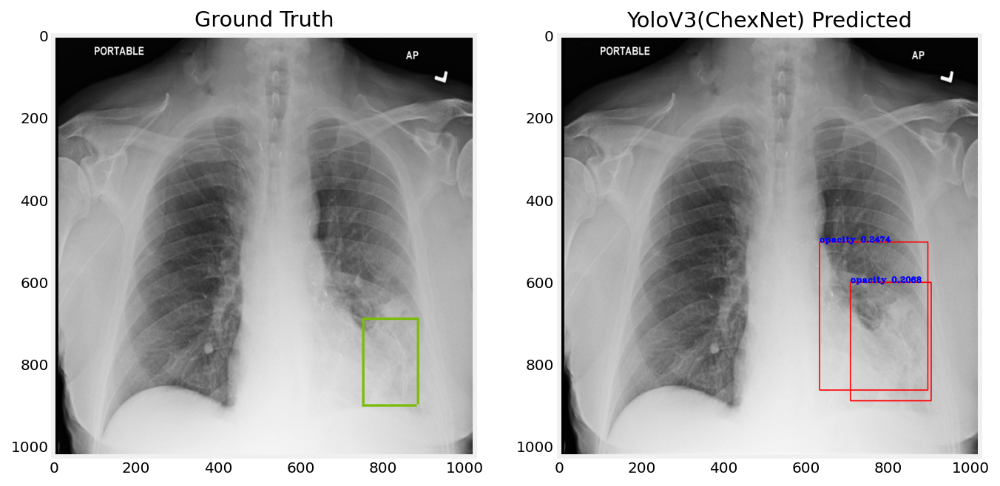

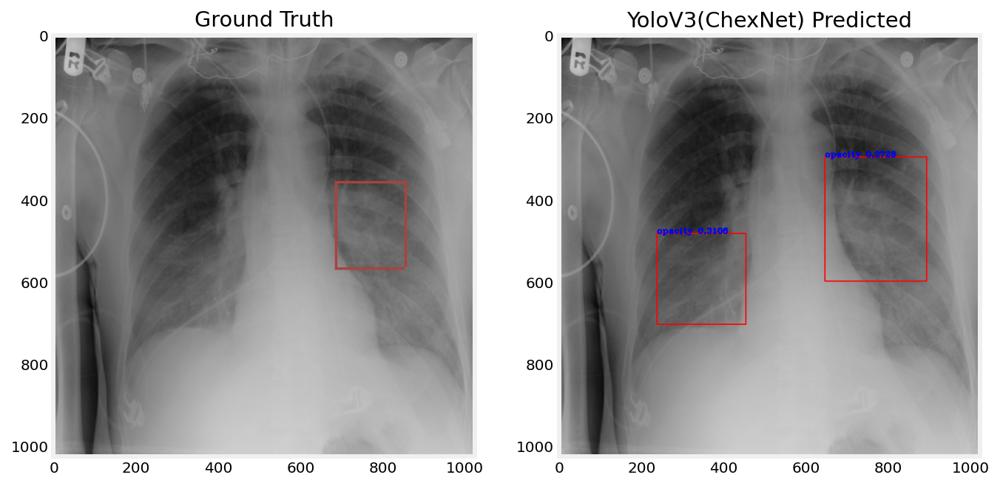

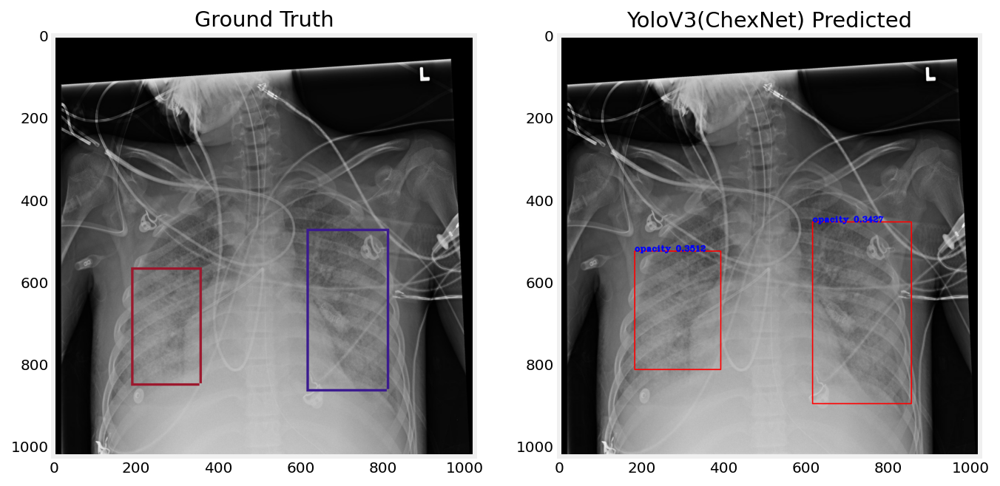

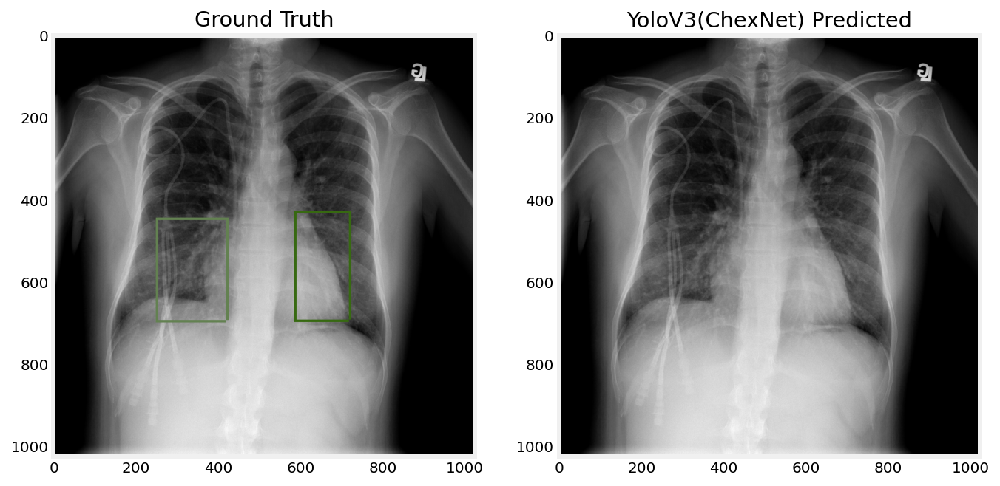

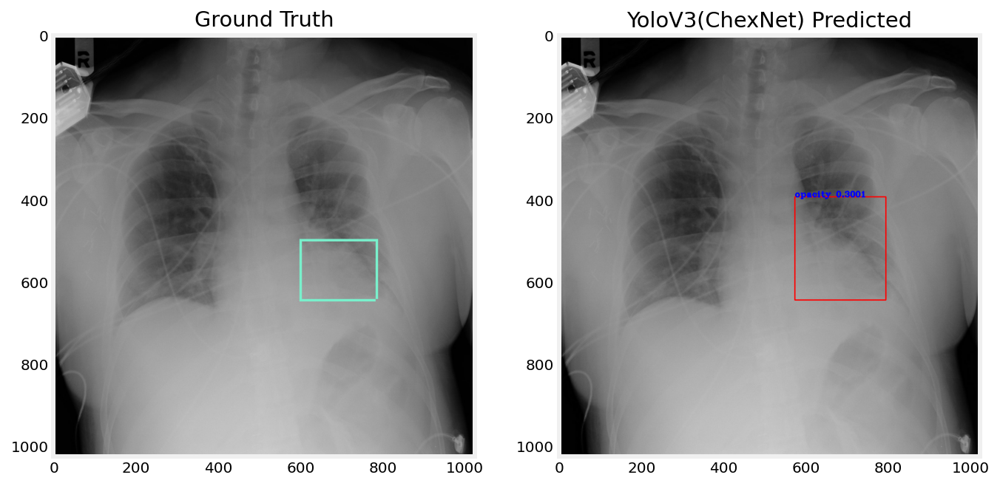

...

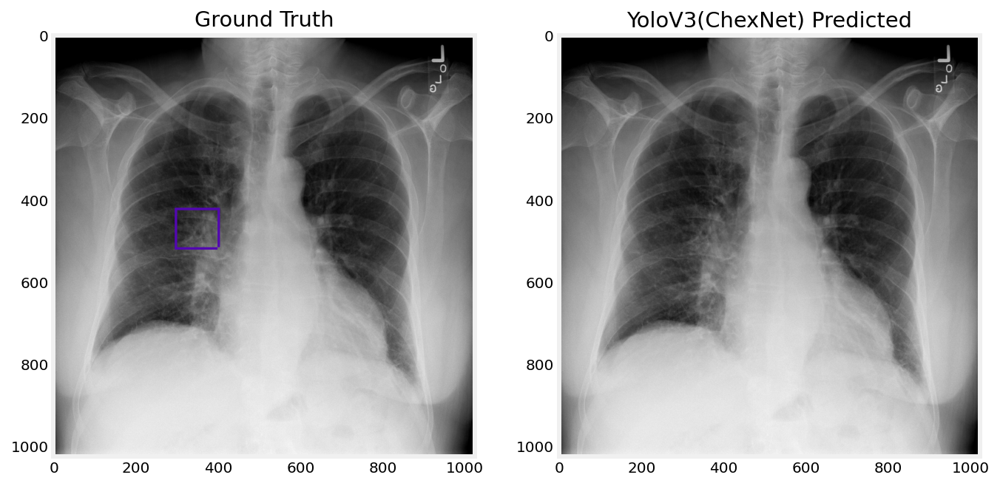

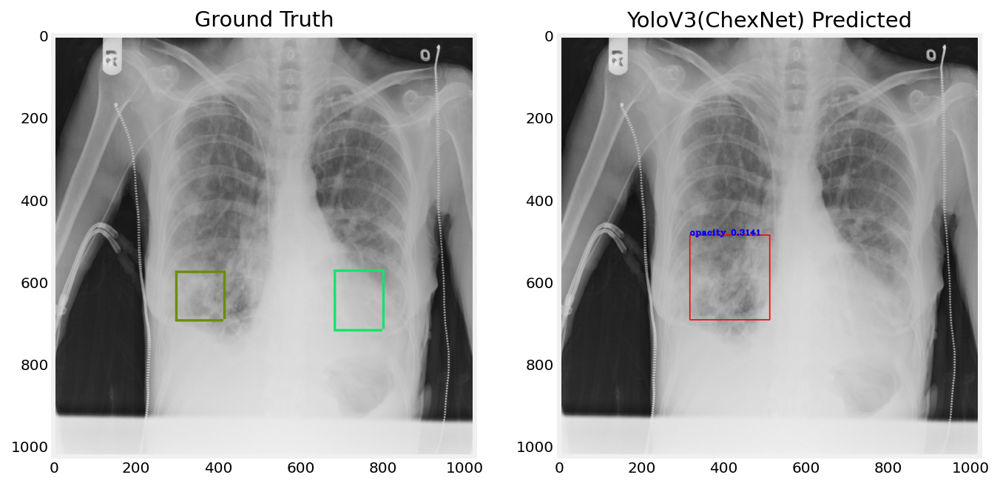

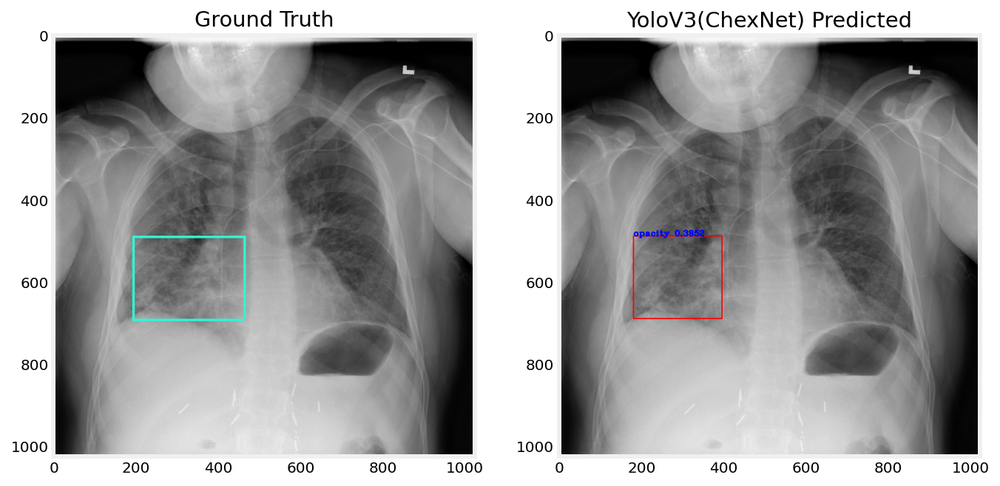

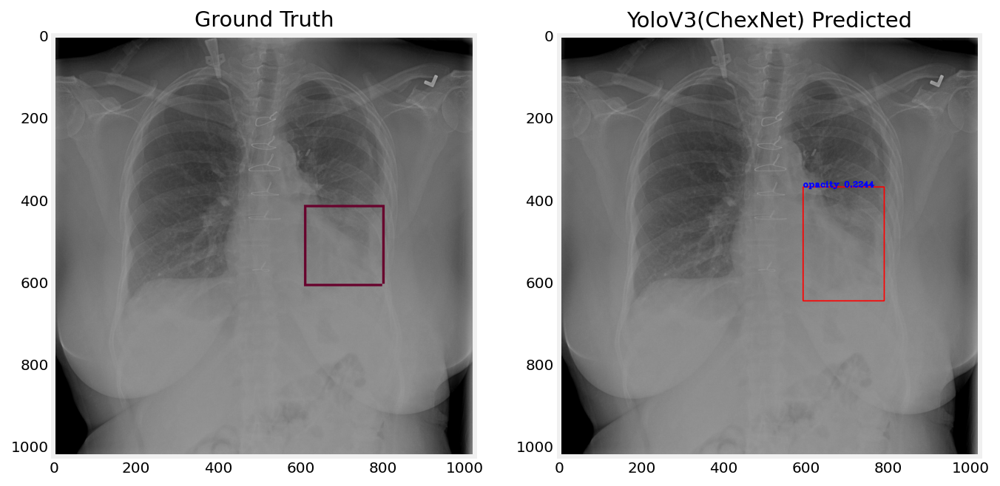

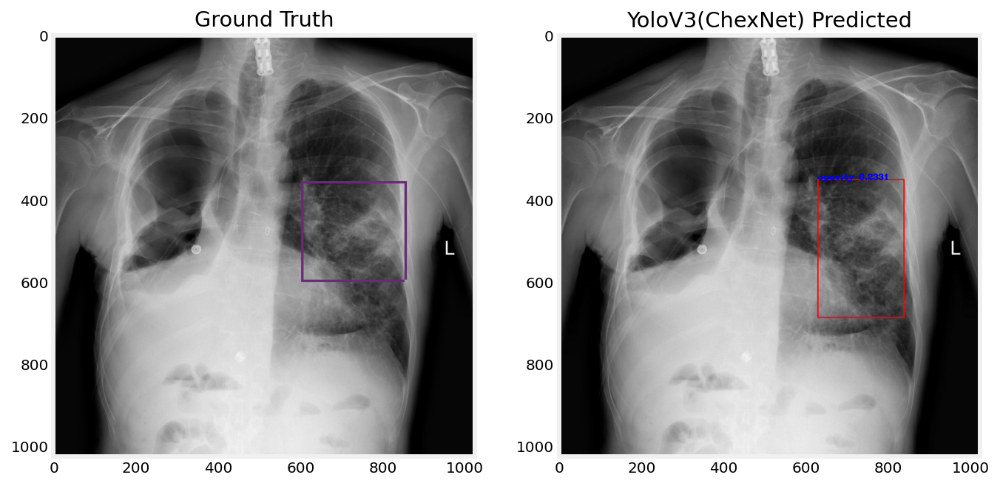

In [62]:
visualize_prediction(model,parsed,ID_s)

## 11.Tensorboard Plots

### epoch vs loss

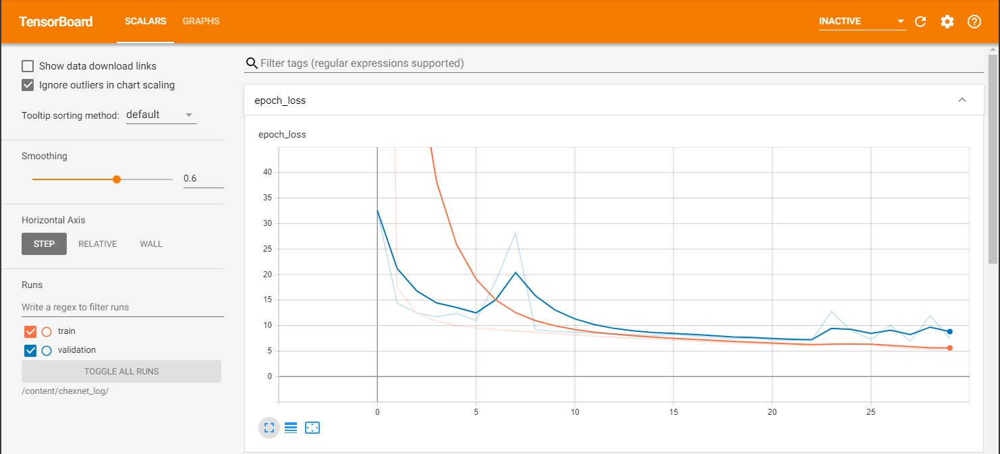

### epoch vs yolo_output_0_loss

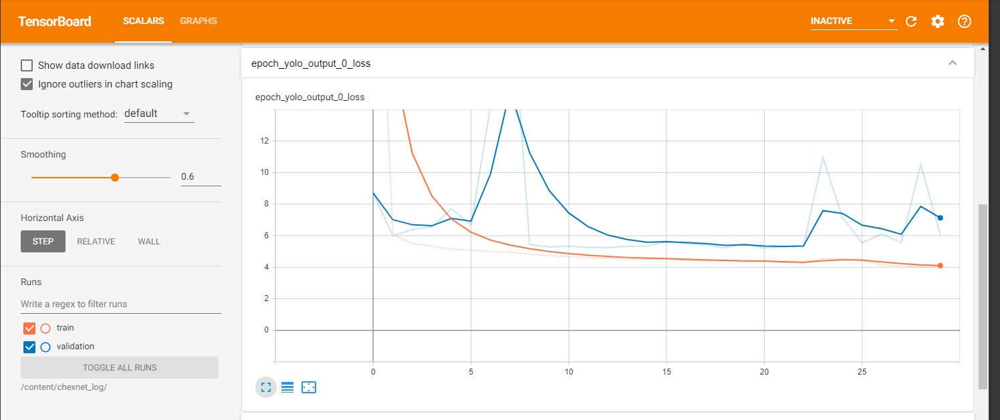

### epoch vs yolo_output_1_loss

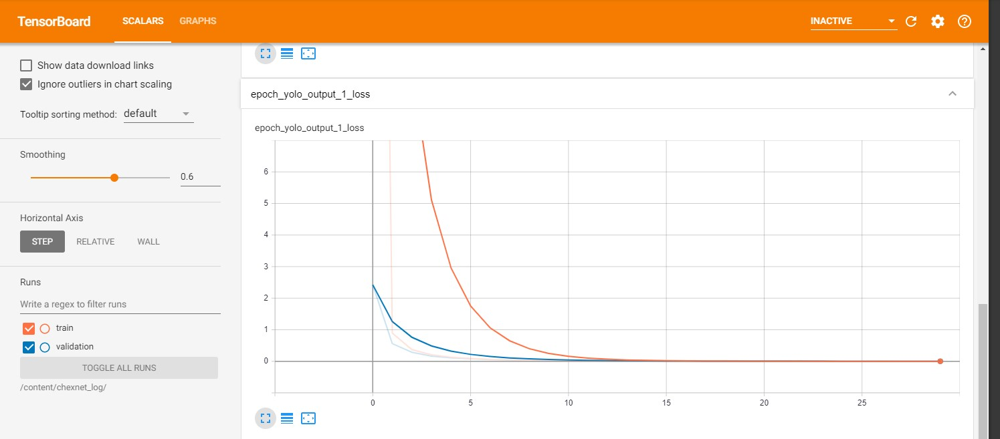

### epoch vs yolo_output_2_loss

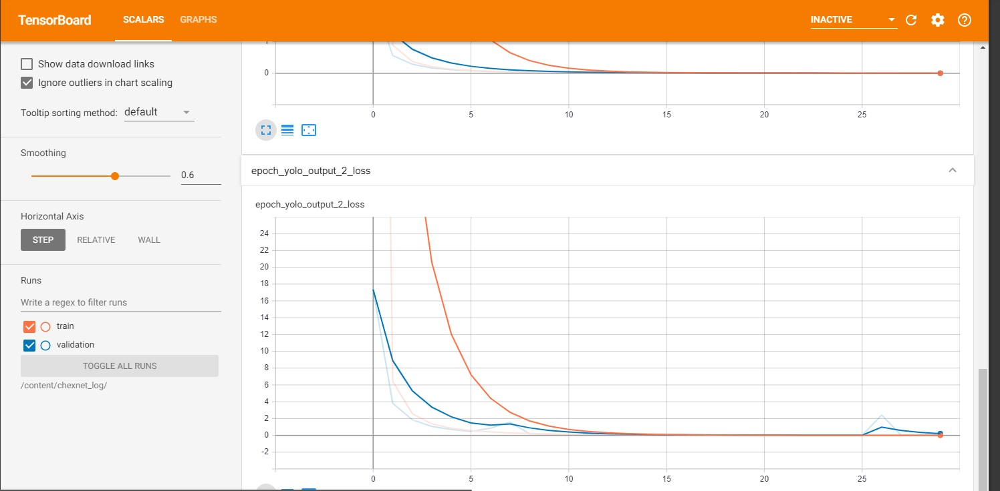

# Summary & Approach

1. We replaced **yoloV3Darknet** backbone with our trained **ChexNet (DenseNet121)** model as **ChexNet** is trained on chest X-rays.
2. **yoloV3_darknethas**  total **61,576,342** parameters and **yoloV3_chexnet** has total **27,993,206** parameters.
3. In comaprision of **yoloV3_darknet**,**yoloV3_chexnet** has almost half number of parameters which makes **yoloV3_chexnet** light & fast to train.
4. we set **yolo_max_boxes = 5** as maximum number of opacities that we got in EDA is 4.
5. we set **yolo_iou_threshold = 0.5** & **yolo_score_threshold = 0.2** as the opacities are difficult to identify in comparision of normal objects.
6. we calculated custom anchor boxes using **k-means**.
7. In total we trained **yoloV3_chexnet** for **30** epochs(as losses are getting converged)
8. Final validation losses that we got are **val_loss: 7.4992 - val_yolo_output_0_loss: 6.0457 - val_yolo_output_1_loss: 9.3626e-04 -val_yolo_output_2_loss: 0.0028**.
9. As the dataset is quite complex and opacity bounding boxes are indistingushable from human eye we got pretty desent results with **yoloV3_chexnet** (if not up to the mark)